# Aufgabenbeschreibung: 
## Datenquelle: https://www.kaggle.com/datasets/sid321axn/gold-price-prediction-dataset
FINAL_USO.csv

**Autor**: Guangfa Wu

Im Rahmen dieser Arbeit werden Daten zu Goldpreisen sowie zu weiteren börsennotierten Titeln untersucht.
Ziel der Untersuchung ist die Prognose des Goldpreises auf Grundlage dieser Datenbasis.

Hierzu wird zunächst eine Analyse der vorhandenen Merkmale durchgeführt, um zu bestimmen, welche Variablen einen signifikanten Einfluss auf die Entwicklung des Goldpreises haben. Merkmale, die keinen oder nur einen geringen Einfluss auf die Zielvariable aufweisen, werden als irrelevant eingestuft und aus dem Datensatz ausgeschlossen.

Die verbleibenden relevanten Merkmale dienen anschließend als Grundlage für den Einsatz verschiedener Machine-Learning-Algorithmen. Durch eine vergleichende Evaluation der Modelle soll ermittelt werden, welches Verfahren die höchste Prognosegüte liefert und somit am besten zur Vorhersage des Goldpreises geeignet ist.


In [203]:

import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_percentage_error, root_mean_squared_error,mean_squared_error,  make_scorer
import matplotlib.dates as mdates
from sklearn import linear_model
from sklearn.svm import SVR
from sklearn.svm import LinearSVR
import os
 


# 1. Einlesen der Datei: FINAL_USO.csv
## Begriffserklärung:

**Open** (Eröffnungskurs): Preis zu Beginn der Handelsperiode (z. B. Tagesbeginn).

**High** (Höchstkurs): Höchster Preis während der Periode.

**Low** (Tiefstkurs): Niedrigster Preis während der Periode.

**Close** (Schlusskurs): Preis am Ende der Periode.

**Adj Close** (Adjusted Close / bereinigter Schlusskurs): Schlusskurs, angepasst um Dividenden, Splits oder Sonderzahlungen – spiegelt den „tatsächlichen“ Wert für Investoren wider.

**Volume** (Handelsvolumen): Anzahl der gehandelten Anteile/Kontrakte.

**Price** (aktueller Preis): Meist synonym zu Close, manchmal auch ein Durchschnitt.

**Trend:** Abgeleitete Richtung (z. B. „steigend“ oder „fallend“) oder numerischer Indikator für Auf-/Abwärtstrend.

1. **Gold ETF**

Date – Datum der Beobachtung.

Open, High, Low, Close, Adj Close, Volume – klassische Börsendaten für einen Gold-ETF (börsengehandelter Fonds, der den Goldpreis abbildet).

2. **S&P 500 Index**

SP_open, SP_high, SP_low, SP_close – Kursdaten des S&P 500.

SP_Ajclose – bereinigter Schlusskurs.

SP_volume – Handelsvolumen des Indexfonds (nicht des Index direkt, sondern meist von ETFs/Futures auf den Index).

3. **Dow Jones Index**

DJ_open, DJ_high, DJ_low, DJ_close – Kursdaten des Dow Jones.

DJ_Ajclose – bereinigter Schlusskurs.

DJ_volume – Handelsvolumen (wie oben).

4. **Eldorado Gold Corporation (EGO) – eine Goldminenfirma**

EG_open, EG_high, EG_low, EG_close – Aktienkursdaten.

EG_Ajclose – bereinigter Schlusskurs.

EG_volume – Handelsvolumen.

5. **EURO – USD Exchange Rate**

EU_Price – Wechselkurs (z. B. 1 EUR = x USD).

EU_open, EU_high, EU_low – Tageskursverlauf.

EU_Trend – Indikator, ob der Euro gegenüber dem USD steigt oder fällt.

6. **Brent Crude Oil Futures**

OF_Price – Preis für Brent-Öl-Futures.

OF_Open, OF_High, OF_Low – Kursverlauf.

OF_Volume – Handelsvolumen.

OF_Trend – Trend des Ölpreises.

7. **Crude Oil WTI USD (West Texas Intermediate – eine Ölsorte)**

OS_Price, OS_Open, OS_High, OS_Low, OS_Trend – wie oben, aber für WTI statt Brent.

8. **Silver Futures**

SF_Price – Silberpreis (Futures).

SF_Open, SF_High, SF_Low – Kursverlauf.

SF_Volume – Handelsvolumen.

SF_Trend – Trend.

9. **US Bond Rate (10 years) – US-Staatsanleihen mit 10 Jahren Laufzeit**

USB_Price – Rendite oder Preis der Anleihe.

USB_Open, USB_High, USB_Low – Kursdaten.

USB_Trend – Trend bei Zinssätzen.

10. **Platinum Price**

PLT_Price, PLT_Open, PLT_High, PLT_Low, PLT_Trend – Kursverlauf von Platin.

11. **Palladium Price**

PLD_Price, PLD_Open, PLD_High, PLD_Low, PLD_Trend – Kursverlauf von Palladium.

12. **Rhodium Price**

RHO_PRICE – Preis von Rhodium (meist nur ein Wert pro Tag, keine Open/High/Low).

13. **US Dollar Index (USDI)**

USDI_Price – Wert des USD-Index.

USDI_Open, USDI_High, USDI_Low – Tageskursverlauf.

USDI_Volume – Handelsvolumen.

USDI_Trend – Trend des Dollar-Index.

z.B.

Der US Dollar Index besteht aktuell aus folgenden Währungen und ihren Gewichtungen:

    Euro (EUR): 57,6 %

    Japanischer Yen (JPY): 13,6 %

    Britisches Pfund (GBP): 11,9 %

    Kanadischer Dollar (CAD): 9,1 %

    Schwedische Krone (SEK): 4,2 %

    Schweizer Franken (CHF): 3,6 %

14. **Gold Miners ETF (GDX)**

GDX_Open, GDX_High, GDX_Low, GDX_Close, GDX_Adj Close, GDX_Volume – ETF auf Goldminen-Unternehmen.

15. **Oil ETF (USO)**

USO_Open, USO_High, USO_Low, USO_Close, USO_Adj Close, USO_Volume – ETF auf US-Rohöl.

## 1.1 Daten wird in ein Pandas DataFrame gelesen

In [204]:

df = pd.read_csv(
    "FINAL_USO.csv",
    na_values=['null'],
    index_col='Date',
    parse_dates=True
)



## 1.2 zeigen die Features(Spalten) und die ersten 10 Zeilen der Daten, um einen Überblick zu bekommen
### Es gibt 1718 Zeilen und 80 Spalten.


In [205]:
ctrl_del=0 # dient zu Steuerung von wiederhplenden Operation damit eine Spalte nicht zwei mal glöscht wird.
cols= df.columns
print("shape of the data: ",  df.shape)
cols

shape of the data:  (1718, 80)


Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

In [206]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03
mean,127.323434,127.854237,126.777695,127.319482,127.319482,8.446327e+06,204.490023,205.372637,203.487014,204.491222,192.204570,1.098026e+08,18161.094398,18244.137842,18073.889095,18164.119043,18164.119043,1.779131e+08,28.276554,28.822555,27.653655,28.209302,27.783958,1.136074e+06,1.208494,1.208531,1.213360,1.203692,0.494761,77.504523,77.521740,78.384936,76.593894,225958.585565,0.498836,70.153097,70.275396,71.120256,69.330990,0.503492,43284.478463,43308.692084,43671.194412,42911.912107,26912.462165,0.480792,2.262769,2.263091,2.286512,2.238765,0.490105,1183.915425,1184.388853,1194.274622,1173.409692,0.484284,766.805122,766.363481,773.529302,759.444208,0.530850,1130.442375,89.809427,89.805442,90.098981,89.509331,27568.300349,0.512806,26.747427,27.071304,26.384575,26.715012,25.924624,4.356515e+07,22.113417,22.307148,21.904657,22.109051,22.109051,1.922313e+07
std,17.526993,17.631189,17.396513,17.536269,17.536269,4.920731e+06,43.831928,43.974644,43.618940,43.776999,48.514161,4.925110e+07,3889.752079,3906.008604,3867.959072,3884.495887,3884.495887,1.212753e+08,20.325861,20.620624,19.972314,20.294635,19.721857,7.301289e+05,0.100535,0.100579,0.100184,0.100695,0.500118,27.400703,27.366113,27.393294,27.322868,88844.540581,0.500144,23.471514,23.480047,23.494737,23.422198,0.500133,7530.704012,7550.423242,7614.302267,7443.076538,21880.969122,0.499776,0.433469,0.433977,0.437574,0.429960,0.500048,273.842095,273.978168,275.427791,271.799909,0.499898,148.307189,148.078365,149.010291,147.381087,0.499193,570.012881,7.516115,7.520788,7.567895,7.459269,14643.314699,0.499982,10.620552,10.706388,10.490908,10.603110,9.886570,2.909151e+07,11.431056,11.478671,11.373997,11.432787,11.432787,1.575743e+07
min,100.919998,100.989998,100.230003,100.500000,100.500000,1.501600e+06,122.059998,122.320000,120.029999,120.290001,104.468536,2.785650e+07,11769.209960,11925.879880,11735.190430,11766.259770,11766.259770,8.410000e+06,2.770000,2.850000,2.730000,2.800000,2.800000,1.645000e+05,1.038700,1.039000,1.041900,1.034100,0.000000,27.880000,27.990000,28.750000,27.100000,11520.000000,0.000000,26.550000,27.340000,27.610000,26.180000,0.000000,33170.000000,33146.000000,33566.000000,32626.000000,40.000000,0.000000,1.358000,1.366000,1.391000,1.321000,0.000000,775.600000,765.300000,786.500000,756.000000,0.000000,470.4500

In [207]:

print("-----------------")
df.head(10) # zeige die ersten 10 Datensätze
#df.tail(20)

-----------------


,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,105.441238,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,74.550003,76.150002,72.150002,72.900002,70.431755,787900,1.3018,1.2982,1.3051,1.2957,1,105.09,104.88,106.50,104.88,14330,1,93.42,94.91,96.00,93.33,0,53604,54248,54248,52316,119440,1,1.911,1.911,1.911,1.911,1,1414.65,1420.30,1423.35,1376.85,0,618.85,614.70,615.00,614.60,1,1425,80.341,80.565,80.630,80.130,22850,0,53.009998,53.139999,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,105.597549,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,73.599998,75.099998,73.349998,74.900002,72.364037,896600,1.3035,1.3020,1.3087,1.2997,1,103.35,103.51,104.56,102.46,140080,0,93.79,93.43,94.80,92.53,1,53458,53650,54030,52890,65390,0,1.851,1.851,1.851,1.851,0,1420.25,1414.75,1431.75,1400.70,1,623.65,622.60,623.45,622.30,1,1400,80.249,80.175,80.395,79.935,13150,0,52.500000,53.180000,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,104.468536,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,69.099998,69.800003,64.199997,64.699997,62.509384,2096700,1.2995,1.3043,1.3044,1.2981,0,103.64,103.63,104.57,102.37,147880,1,94.09,93.77,94.43,92.55,1,52961,53400,53400,52544,67280,0,1.810,1.810,1.810,1.810,0,1411.10,1422.65,1427.60,1404.60,0,608.80,626.00,630.00,608.60,0,1400,80.207,80.300,80.470,80.125,970,0,52.490002,52.549999,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,107.629784,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,66.449997,68.099998,66.000000,67.000000,64.731514,875300,1.3079,1.3003,1.3133,1.2994,1,106.73,104.30,107.27,103.91,170240,1,95.55,96.39,99.70,96.39,1,53487,52795,53575,52595,55130,1,1.927,1.927,1.927,1.927,1,1434.75,1408.95,1436.55,1408.15,1,626.65,622.45,622.45,622.45,1,1400,80.273,80.890,80.940,80.035,22950,1,52.380001,53.250000,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,107.838242,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,67.099998,69.400002,66.900002,68.500000,66.180725,837600,1.3045,1.3079,1.3197,1.3024,0,107.71,107.15,108.17,106.16,145090,1,99.01,97.54,99.26,96.81,1,53148,53519,54184,52937,75950,0,1.970,1.970,1.970,1.970,1,1429.05,1434.40,1453.75,1417.65,0,635.90,625.70,641.50,623.80,1,1400,80.350,80.105,80.445,79.550,24140,1,53.150002,53.430000,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [208]:
#print(df['DJ_volume'].loc[0:10])
print(df['DJ_volume'].head(10))


Date
2011-12-15    136930000
2011-12-16    389520000
2011-12-19    135170000
2011-12-20    165180000
2011-12-21    163250000
2011-12-22    151610000
2011-12-23     80420000
2011-12-27     95980000
2011-12-28     84010000
2011-12-29      8410000
Name: DJ_volume, dtype: int64


## 1.3  Prüfen leeres Zeichen und  Nan-Werte:
**Ergebnis**: Es gibt kein leeres Zeichen und Nan-Werte. Keine Datenbereinigung ist nötig.


In [209]:
# Prüfen auf leere Strings oder Strings nur mit Whitespaces in allen Spalten
empty_cells = df.apply(lambda col: col.astype(str).str.strip() == "").any().any()
print("empty_cells:", empty_cells)
print("-------------")
print("summe von Nan-Werte in jeder Spalte:\n", df.isna().sum()) # prüfe Nan in jeder Spalte
print("-------------")
print("Nan exists:", df.isnull().values.any() ) # prüfen ob es insgesamt Nan gibt



empty_cells: False
-------------
summe von Nan-Werte in jeder Spalte:
 Open             0
High             0
Low              0
Close            0
Adj Close        0
                ..
USO_High         0
USO_Low          0
USO_Close        0
USO_Adj Close    0
USO_Volume       0
Length: 80, dtype: int64
-------------
Nan exists: False


## 1.4 Allgemeine Info über die Daten durch df.info(): 
Es wird festgestellt dass es nur Datentype von int64 und float64 gibt


In [210]:
df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1718 entries, 2011-12-15 to 2018-12-31
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Open           1718 non-null   float64
 1   High           1718 non-null   float64
 2   Low            1718 non-null   float64
 3   Close          1718 non-null   float64
 4   Adj Close      1718 non-null   float64
 5   Volume         1718 non-null   int64  
 6   SP_open        1718 non-null   float64
 7   SP_high        1718 non-null   float64
 8   SP_low         1718 non-null   float64
 9   SP_close       1718 non-null   float64
 10  SP_Ajclose     1718 non-null   float64
 11  SP_volume      1718 non-null   int64  
 12  DJ_open        1718 non-null   float64
 13  DJ_high        1718 non-null   float64
 14  DJ_low         1718 non-null   float64
 15  DJ_close       1718 non-null   float64
 16  DJ_Ajclose     1718 non-null   float64
 17  DJ_volume      1718 non-null   int

# 2. EDA (explorative Data Analysis)
## 2.1 Prüfen ob die Spalte "Close" und "Adj Close" gleich sind?
 **Ergebnis der Prüfung**: die beiden Spalten sind gleich.  löschen die Spalte "Adj Close", 
 


In [211]:
df1= df["Close"]-df["Adj Close"]
print(type(df1))
print("Summe von Differnz: [Close]-[Adj Close]: ", df1.sum())

<class 'pandas.core.series.Series'>
Summe von Differnz: [Close]-[Adj Close]:  0.0


In [212]:
if (ctrl_del==0):
  df = df.drop(columns=["Adj Close"])
  ctrl_del=1  
cols= df.columns
print("shape:", df.shape)
cols


shape: (1718, 79)


Index(['Open', 'High', 'Low', 'Close', 'Volume', 'SP_open', 'SP_high',
       'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open', 'DJ_high',
       'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open', 'EG_high',
       'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price', 'EU_open',
       'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open', 'OF_High',
       'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open', 'OS_High',
       'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High', 'SF_Low',
       'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High', 'USB_Low',
       'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO_Low', 'USO_C

## 2.2 Auswahl von Datenspalten
### Allgemeine Kenntnisse über die Korrelationen von Goldpreis mit anderen wichtigen Märkten und börsenotierten Titeln

- Gold vs. USDX (US-Dollar-Index):
In der Regel negativ korreliert.
Ein stärkerer Dollar drückt den Goldpreis, da Gold in USD gehandelt wird. Schwächelt der USD, wird Gold attraktiver für Investoren.

- Gold vs. Dow Jones Index:
Meist negativ korreliert, aber nicht konstant.
In Krisenzeiten flüchten Anleger in Gold (sicherer Hafen), was oft mit fallenden Aktienkursen einhergeht. In Boomphasen fließt Kapital dagegen eher in Aktien.

- Gold vs. GDX (Gold Miners ETF):
Sehr stark positiv korreliert (Korrelation ~0,9).
Da Goldminen-Unternehmen vom Goldpreis abhängen, spiegelt sich jede größere Bewegung im Goldpreis direkt im ETF wider.

- Gold vs. US 10-Year Bond Rate:
Negativ korreliert.
Steigende Anleiherenditen machen Bonds attraktiver, da sie sichere Zinsen bieten → Kapital fließt aus Gold ab. Sinkende Renditen (z. B. in Krisenzeiten) erhöhen dagegen die Attraktivität von Gold, da es keine Zinsen abwirft, aber als Wertspeicher dient.

**Von Interesse sind die folgenden Feutures:**

- DJ_Close – Schlusskurs des Dow Jones Index

- USB_Price – Rendite der 10-jährigen US-Staatsanleihen

- USDI_Price – US-Dollar-Index

- GDX_Close – Schlusskurs des Gold Miners ETF

**Nicht berücksichtigt (vorerst):**

- EG_Close – Schlusskurs von Eldorado Gold (zu volatil für eine zuverlässige Goldpreis-Prognose)

- PLT_Price – Platinpreis (interessant, aber zunächst außen vor)

- PLD_Price – Palladiumpreis (interessant, aber zunächst außen vor)

## 2.3 Auswahl von Spalten aus originalen Daten und Erzeugung von einem neuen DataFrame
**Vorgehensweise:** Definition der Spalten durch eine Liste: Das ist sehr flexible

columns_of_interest = ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close']


In [213]:

# Wir wählen nur die gewünschten Spalten
columns_of_interest = ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close']

df_selected = df[columns_of_interest].copy()

print(df_selected.head(20))
print(df_selected.tail(20))


                 Close     DJ_close  USB_Price  USDI_Price  GDX_Close
Date                                                                 
2011-12-15  152.330002  11868.80957      1.911      80.341  51.680000
2011-12-16  155.229996  11866.38965      1.851      80.249  52.680000
2011-12-19  154.869995  11766.25977      1.810      80.207  51.169998
2011-12-20  156.979996  12103.58008      1.927      80.273  52.990002
2011-12-21  157.160004  12107.74023      1.970      80.350  52.959999
2011-12-22  156.039993  12169.65039      1.953      80.306  52.400002
2011-12-23  156.309998  12294.00000      2.021      80.236  52.790001
2011-12-27  154.910004  12291.34961      2.002      80.135  51.869999
2011-12-28  151.029999  12151.41016      1.921      80.883  50.060001
2011-12-29  150.339996  12287.04004      1.899      80.911  51.200001
2011-12-30  151.990005  12217.55957      1.876      80.522  51.430000
2012-01-03  155.919998  12397.37988      1.956      79.912  53.799999
2012-01-04  156.7100

## 2.4 Graphische Darstellung von Goldpreis und andere Merkmalen
### Linienplot: y-Goldpreis ;  x- Datum: um den Verlauf des Goldpreises in Verlauf der Zeit zu analysieren.
### Scatterplot: y-Goldpreis;  x-andere Merkmale: um die Korrelation von Goldpreis mit anderen Merkmalen zu analysieren.
 

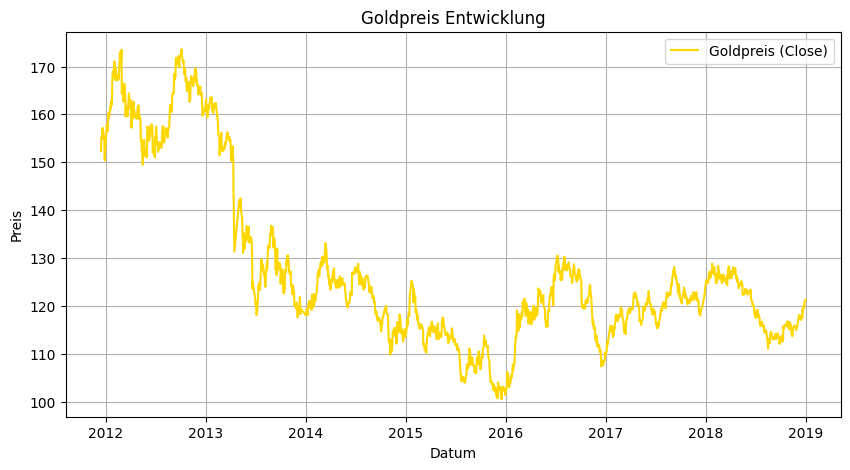

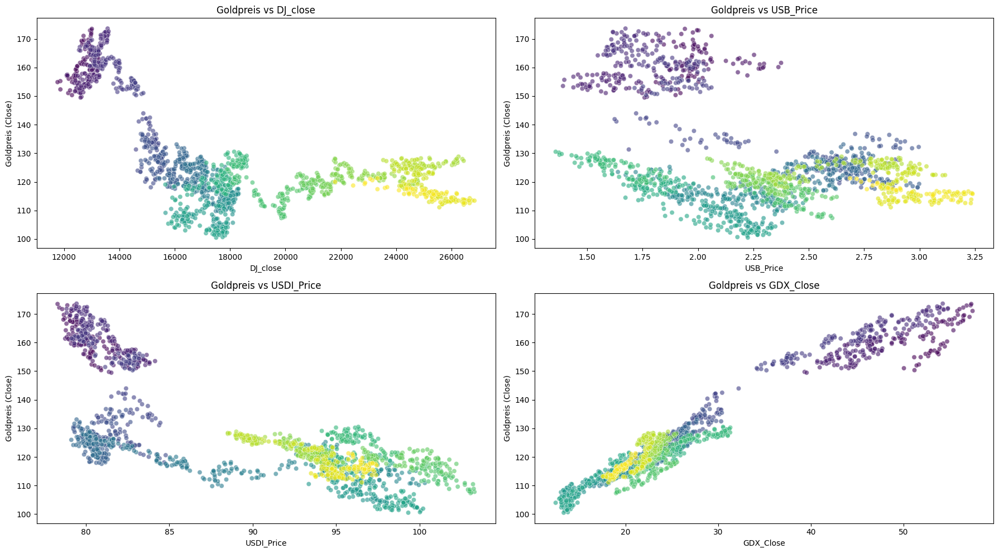

In [214]:
import matplotlib.pyplot as plt
import seaborn as sns

# --------------------------
# 1. Zeitreihe Goldpreis
# --------------------------
plt.figure(figsize=(10, 5))
plt.plot(df_selected.index, df_selected["Close"], label="Goldpreis (Close)", color="gold")
plt.title("Goldpreis Entwicklung")
plt.xlabel("Datum")
plt.ylabel("Preis")
plt.legend()
plt.grid(True)
plt.show()

# --------------------------
# 2. Scatterplots: Gold vs. alle anderen Variablen
# --------------------------
other_cols = [col for col in df_selected.columns if col != "Close"]

# mehrere Subplots in einem Grid
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
axes = axes.flatten()

for i, col in enumerate(other_cols):
    sns.scatterplot(
        x=df_selected[col],
        y=df_selected["Close"],
        c=df_selected.index,
        alpha=0.6,
        ax=axes[i]
    )
    axes[i].set_title(f"Goldpreis vs {col}")
    #axes[i].set_xlabel("Goldpreis (Close)")
    #axes[i].set_ylabel(col)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Goldpreis (Close)")

plt.tight_layout()
plt.show()


## 2.5 Ein paar plots für besseres Verständnis und Vergleich : 
### x-Achse: Datum; y-Achse: ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close'];
1. Goldpreis mit der Zeireihen
2. Dow Jones Index mit der Zeireihen
3. US Bond Rate (10 years) mit der Zeireihen
4. US Dollar Index (USDI) mit der Zeireihen
5. Gold Miners ETF (GDX) mit der Zeireihen
### Scatter plots mit Regression Linie

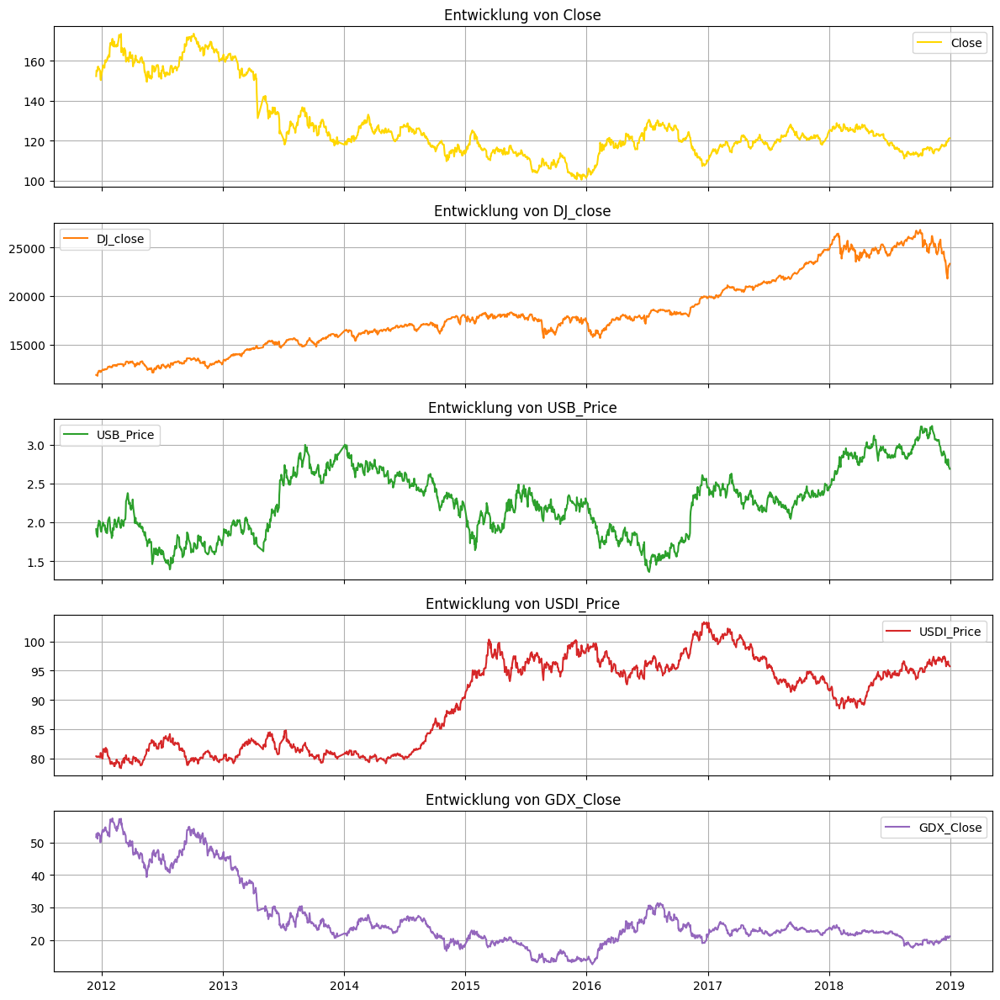

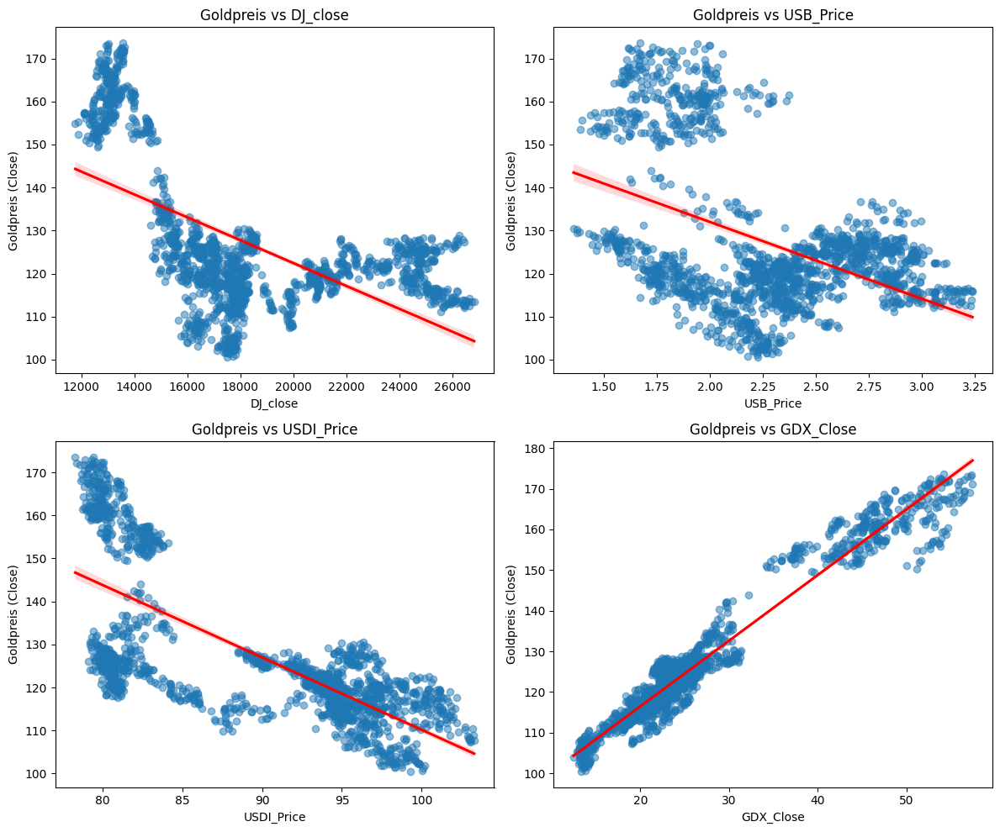

In [215]:
import matplotlib.pyplot as plt
import seaborn as sns

# --------------------------
# 1. Zeitreihe Goldpreis
# --------------------------
'''
plt.figure(figsize=(10, 5))
plt.plot(df_selected.index, df_selected["Close"], label="Goldpreis (Close)", color="gold")
plt.title("Goldpreis Entwicklung")
plt.xlabel("Datum")
plt.ylabel("Preis")
plt.legend()
plt.grid(True)
plt.show()
'''

# Zeitreihe Goldpreis
columns_of_interest = ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close']

# Farbpalette für die anderen Spalten
palette = plt.cm.tab10.colors  

fig, axes = plt.subplots(len(columns_of_interest), 1, figsize=(12, 12), sharex=True)

for i, col in enumerate(columns_of_interest):
    if col == "Close":
        color = "gold"   # feste Farbe für Close
    else:
        color = palette[i % len(palette)]  # automatische Farben für die anderen
    axes[i].plot(df_selected.index, df_selected[col], label=col, color=color)
    axes[i].set_title(f"Entwicklung von {col}")
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()


# --------------------------
# 2. Scatterplots + Regressionsgeraden
# --------------------------
other_cols = [col for col in df_selected.columns if col != "Close"]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()


for i, col in enumerate(other_cols):
    sns.regplot(
        y=df_selected["Close"],
        x=df_selected[col],
        scatter_kws={"alpha": 0.5},
        line_kws={"color": "red"},
        ax=axes[i]
    )
    axes[i].set_title(f"Goldpreis vs {col}")
    axes[i].set_ylabel("Goldpreis (Close)")
    axes[i].set_xlabel(col)

plt.tight_layout()
plt.show()



## 2.6 Plot für den Zeitabschnitt: 2012 bis 2015; 2017 bis 2019 für bessere Intepretation der Korrelation

Von 2012 bis 2015 erkennt man einen Zusammenhang zwischen dem Goldpreis und anderen Märkten, auch wenn es zwischendurch kleine Schwankungen gibt.

Steigt der Dow Jones (DJ) dauerhaft, fällt der Goldpreis. Der Grund: In einem starken Aktienmarkt erwarten Anleger mehr Gewinne, also wird Geld aus Gold abgezogen und in Aktien investiert.

Bei US-Staatsanleihen zeigt sich vor allem zwischen Januar und September 2013 ein deutlicher negativer Zusammenhang mit dem Goldpreis.

Auch der US-Dollar-Index (USDI) entwickelt sich meist entgegengesetzt zum Goldpreis – mal sehr stark, mal weniger ausgeprägt.

Die Kurse der Goldminenunternehmen (GDX) hingegen bewegen sich fast identisch wie der Goldpreis – hier besteht eine besonders enge Korrelation.

Besonders deutlich treten die oben beschriebenen Zusammenhänge im Zeitraum von 2018 bis 2019 hervor.

In [216]:
# Zeitreihe Goldpreis
df_selected.index = pd.to_datetime(df_selected.index)

# Teil-DataFrames erzeugen
df_2011_2014 = df_selected.loc["2011":"2014"]
df_2017_2019 = df_selected.loc["2017":"2019"]

#print("2011–2014:")
#print(df_2011_2014.head())

print("\n2017–2019:")
print(df_2017_2019.head())




2017–2019:
                 Close     DJ_close  USB_Price  USDI_Price  GDX_Close
Date                                                                 
2017-01-03  110.470001  19881.75977      2.448     103.201  21.760000
2017-01-04  110.860001  19942.16016      2.441     102.709  21.920000
2017-01-05  112.580002  19899.28906      2.348     101.528  23.200001
2017-01-06  111.750000  19963.80078      2.421     102.209  22.389999
2017-01-09  112.669998  19887.38086      2.368     101.909  22.459999


Zeitraum:  2011_2014


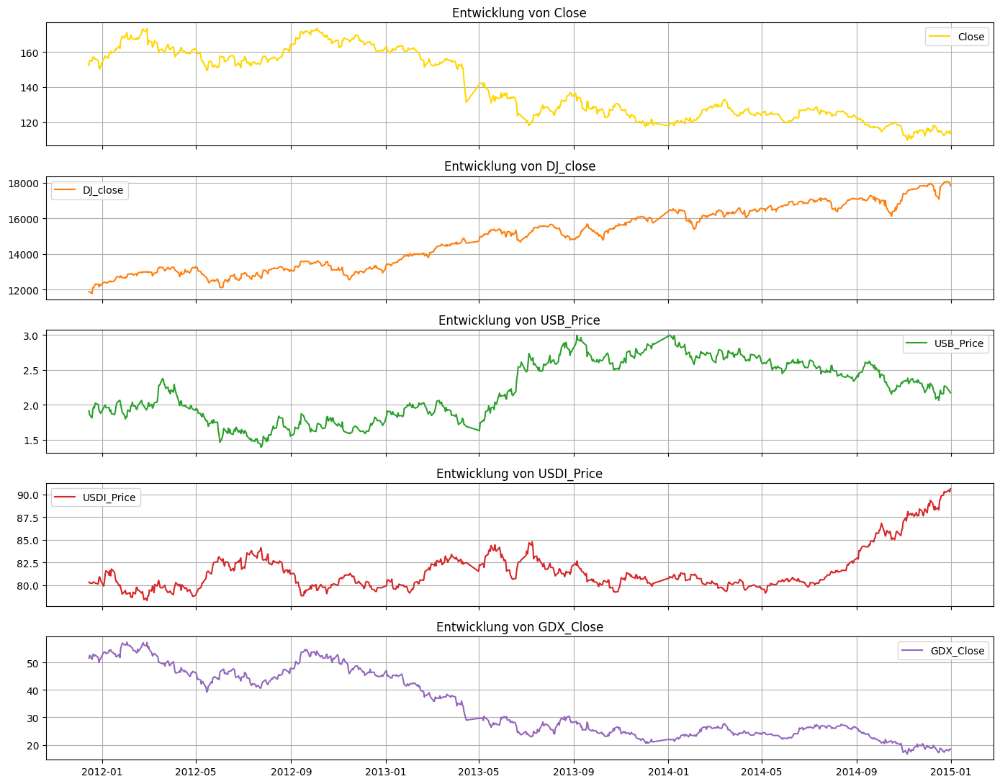

Zeitraum: 2017_2019


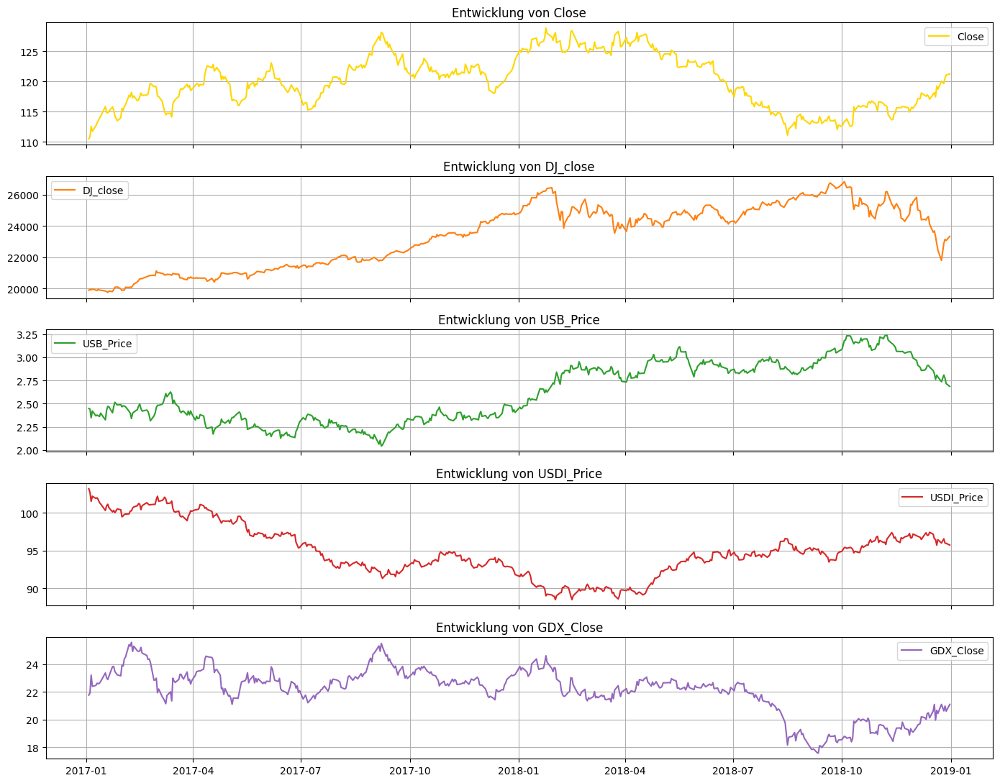

In [217]:
#df_2011_2014 = df_selected.loc["2011":"2014"]
#df_2017_2019 = df_selected.loc["2017":"2019"]

columns_of_interest = ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close']

# Farbpalette für die anderen Spalten
palette = plt.cm.tab10.colors  
print("=========================================================================================================")
print("Zeitraum:  2011_2014" )
print("=========================================================================================================")

fig, axes = plt.subplots(len(columns_of_interest), 1, figsize=(14, 11), sharex=True)

for i, col in enumerate(columns_of_interest):
    if col == "Close":
        color = "gold"   # feste Farbe für Close
    else:
        color = palette[i % len(palette)]  # automatische Farben für die anderen
    axes[i].plot(df_2011_2014.index, df_2011_2014[col], label=col, color=color)
    axes[i].set_title(f"Entwicklung von {col}")
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()

print("=========================================================================================================")
print("Zeitraum: 2017_2019" )
print("=========================================================================================================")
fig, axes = plt.subplots(len(columns_of_interest), 1, figsize=(14, 11), sharex=True)

for i, col in enumerate(columns_of_interest):
    if col == "Close":
        color = "gold"   # feste Farbe für Close
    else:
        color = palette[i % len(palette)]  # automatische Farben für die anderen
    axes[i].plot(df_2017_2019.index, df_2017_2019[col], label=col, color=color)
    axes[i].set_title(f"Entwicklung von {col}")
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()



# 3. Bestimmung von Zielspalte y: 
Aus der Spalte „Close“ wird durch Kopie eine Zielspalte „y“ erstellt.
Für die Spalten ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close', 'y'] werden gleitende Mittelwerte über unterschiedliche Zeiträume (3, 5, 22 und 65 Tage) berechnet.
Die Idee dahinter ist, dass längere Zeiträume eine bessere Einschätzung des übergeordneten Trends ermöglichen und somit Hinweise auf die längerfristige Preisentwicklung geben können.
Die so gewonnenen Merkmale dienen anschließend als Grundlage für die weitere Datenverarbeitung.

Beim Mittelbildung entstehen NaN-Werte. Die Zeilen mit NaN-Werten( es gibt 1718 Zeilen in dem Datensatz) werden gelöscht.

Insgesamt gibt es dann folgende Spalten:

['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close', 'y',
       'Close_3', 'Close_5', 'Close_22', 'Close_65', 'DJ_close_3',
       'DJ_close_5', 'DJ_close_22', 'DJ_close_65', 'USB_Price_3',
       'USB_Price_5', 'USB_Price_22', 'USB_Price_65', 'USDI_Price_3',
       'USDI_Price_5', 'USDI_Price_22', 'USDI_Price_65', 'GDX_Close_3',
       'GDX_Close_5', 'GDX_Close_22', 'GDX_Close_65', 'y_3', 'y_5', 'y_22',
       'y_65']

Die Zielspalte ist jeweils eine der Spalten y, y_3, y_5, y_22 oder y_65.

Für jede Modellierung wird eine von  y, y_3, y_5 ausgewählt.

Die gewählte Zielspalte wird anschließend um eine bestimmte Anzahl von Zeilen nach oben verschoben:

z.B.

- eine Zeile nach oben entspricht dem Wert für morgen,

- zwei Zeilen nach oben dem Wert für übermorgen usw.


**Darstellung von Mittelwertbildung:**

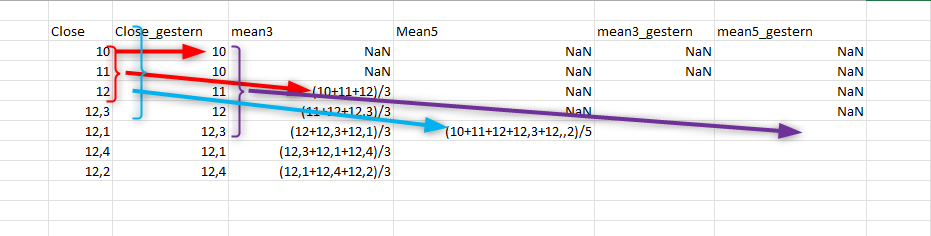
 



## 3.1 Spalte y (y_3, y_5, y_22, y_65) und Zusätzliche Spalten

       'Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close', 'y',

       'Close_3', 'Close_5', 'Close_22', 'Close_65',
       
       'DJ_close_3','DJ_close_5', 'DJ_close_22', 'DJ_close_65',
       
       'USB_Price_3','USB_Price_5', 'USB_Price_22', 'USB_Price_65',
       
       'USDI_Price_3','USDI_Price_5', 'USDI_Price_22', 'USDI_Price_65',
       
       'GDX_Close_3', 'GDX_Close_5', 'GDX_Close_22', 'GDX_Close_65',
       
       'y_3', 'y_5', 'y_22','y_65'

In [218]:
ctrl_col=0
avg_period = [3,5,22,65] # Auswahl von Tage für Mittelwert
columns_selected = ['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close','y']

In [219]:
def create_columns(df_selected, columns_selected, avg_period):
 df_selected.loc[:,'y'] = df_selected['Close']
# 3 days, 5 days, 22days (1 month), 65day(1 Quarter), 130 day(6 Months). no transaction at weekend, ca. 22 days a month
 avg_period = [3,5,22,65]
 for col in columns_selected :
   for ap in avg_period:
        c_new = f"{col}_{ap}"
        #print(c_new)
        # df_selected[c_new] = df_selected[c].rolling(window=ap).mean()
        df_selected.loc[:,c_new] = df_selected[col].rolling(window=ap).mean()
        
 df_selected = df_selected.dropna(axis=0) 
 return df_selected 

In [220]:
if( ctrl_col==0):
 df_selected= create_columns(df_selected, columns_selected, avg_period)
 ctrl_col=ctrl_col+1

print(df_selected.columns)

Index(['Close', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close', 'y',
       'Close_3', 'Close_5', 'Close_22', 'Close_65', 'DJ_close_3',
       'DJ_close_5', 'DJ_close_22', 'DJ_close_65', 'USB_Price_3',
       'USB_Price_5', 'USB_Price_22', 'USB_Price_65', 'USDI_Price_3',
       'USDI_Price_5', 'USDI_Price_22', 'USDI_Price_65', 'GDX_Close_3',
       'GDX_Close_5', 'GDX_Close_22', 'GDX_Close_65', 'y_3', 'y_5', 'y_22',
       'y_65'],
      dtype='object')


In [221]:
df_selected.head()
        

,Close,DJ_close,USB_Price,USDI_Price,GDX_Close,y,Close_3,Close_5,Close_22,Close_65,DJ_close_3,DJ_close_5,DJ_close_22,DJ_close_65,USB_Price_3,USB_Price_5,USB_Price_22,USB_Price_65,USDI_Price_3,USDI_Price_5,USDI_Price_22,USDI_Price_65,GDX_Close_3,GDX_Close_5,GDX_Close_22,GDX_Close_65,y_3,y_5,y_22,y_65
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-03-21,160.210007,13124.62012,2.296,79.896,49.759998,160.210007,160.643336,160.862003,165.751365,163.014616,13177.980143,13203.864064,13023.119585,12690.581732,2.344667,2.3222,2.086727,1.988800,79.811000,79.8606,79.453318,79.878077,49.739999,49.857999,53.411364,53.718154,160.643336,160.862003,165.751365,163.014616
2012-03-22,159.570007,13046.13965,2.282,79.998,48.750000,159.570007,159.970006,160.560004,165.230910,163.126000,13113.650067,13162.540040,13026.776368,12708.694502,2.313667,2.3228,2.096773,1.994508,79.906333,79.8330,79.492500,79.872800,49.456666,49.579999,53.090000,53.673077,159.970006,160.560004,165.230910,163.126000
2012-03-23,161.529999,13080.73047,2.233,79.576,49.759998,161.529999,160.436671,160.606003,164.712274,163.222923,13083.830080,13132.162110,13033.233666,12727.376669,2.270333,2.3098,2.107273,2.000385,79.823333,79.8014,79.504909,79.862446,49.423332,49.545999,52.768636,53.628154,160.436671,160.606003,164.712274,163.222923
2012-03-26,164.399994,13241.62988,2.253,79.179,50.630001,164.399994,161.833333,161.168002,164.320455,163.369539,13122.833333,13132.662110,13044.912732,12750.074670,2.256000,2.2854,2.118955,2.007200,79.584333,79.6948,79.518227,79.846631,49.713333,49.752000,52.467273,53.619846,161.833333,161.168002,164.320455,163.369539
2012-03-27,163.240005,13197.73047,2.187,79.222,49.910000,163.240005,163.056666,161.790002,163.911819,163.465847,13173.363607,13138.170118,13054.675471,12766.907753,2.224333,2.2502,2.128500,2.011200,79.325667,79.5742,79.555545,79.830462,50.100000,49.761999,52.169545,53.572462,163.056666,161.790002,163.911819,163.465847


## 3.2. Korrelation der wichtigen Spalten und Auswahl von Merkmalen:
Die Variablen Close, Close_3 und Close_5 weisen eine vollständige Korrelation (100 %) auf. Zudem besteht eine starke Korrelation zwischen Close und den längerfristigen Mittelwerten Close_22 sowie Close_65. Daraus folgt, dass diese Merkmale nicht gleichzeitig in einer linearen Regression verwendet werden sollten, um Multikollinearität zu vermeiden.
Dasselbe gilt analog für die weiteren Spalten DJ_close, USB_Price, USDI_Price und GDX_Close.

### Kombination von Merkmalspalten für Preisvoraussage:
y.shift(-1) → Vorhersage des exakten nächsten Tagespreises, Gut, wenn punktgenaue Vorhersage gewünscht ist, Kann aber stärker schwanken

y_3.shift(-1) → Vorhersage des 3-Tages-Durchschnitts, Stabiler, weniger empfindlich gegen kurzfristige Schwankungen

y_5.shift(-1) → Vorhersage des 3-Tages-Durchschnitts, Stabiler, weniger empfindlich gegen kurzfristige Schwankungen

Folgende Kombination sind ausgewählt für die Vorhersage:

### Close + y → klassische punktgenaue Vorhersage
### Close + Close_22 + y → klassische punktgenaue Vorhersage mit zusätzlicher Information aus Close_22
### Close + Close_22 + y_3 → Trendvorhersage für 3 Tage (gegünstigt bei moderaten Schwankungen)
### Close + Close_22 + y_5 → Trendvorhersage für 5 Tage (gegünstigt bei moderaten Schwankungen)

Warum gut:

Keine extremen Preissprünge → geglätteter Trend ist repräsentativ

Modell nutzt sowohl aktuellen Preis als auch mittelfristigen Trend → bessere Vorhersagequalität

### Fazit:
### Für Goldpreise ist Close + Close_22 als Feature und y_3.shift(-1) als Target oft die stabilste und sinnvollste Kombination, weil sie Trends vorhersagt, ohne jeden kurzfristigen Sprung zu überbewerten.


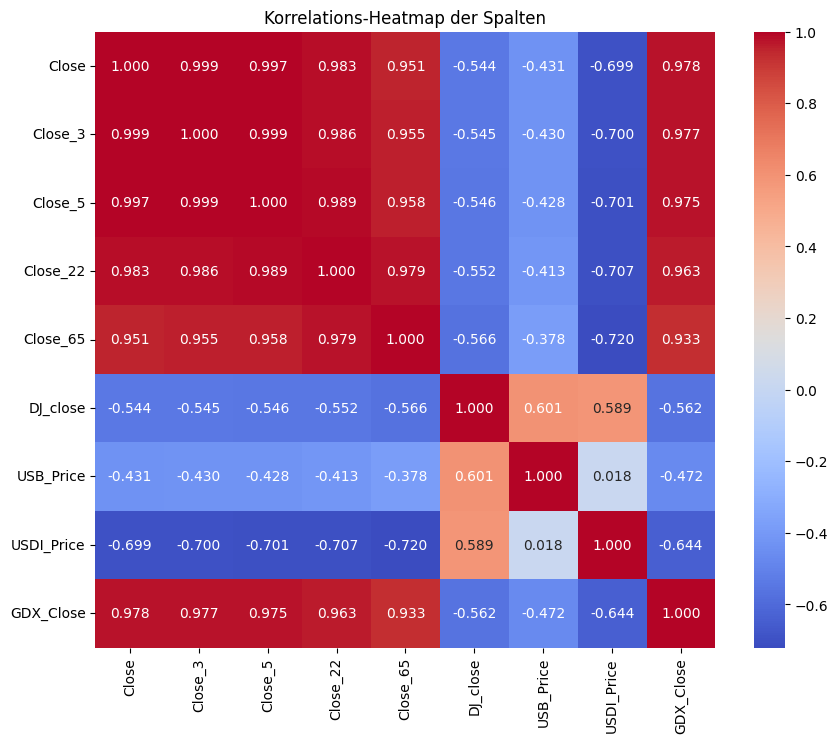

In [222]:
import seaborn as sns
import matplotlib.pyplot as plt

columns_of_interest_mean = ['Close','Close_3','Close_5', 'Close_22', 'Close_65','DJ_close',	'USB_Price','USDI_Price','GDX_Close']
df_mean = df_selected[columns_of_interest_mean].copy()

# Nur die relevanten Spalten auswählen
df_corr = df_mean[columns_of_interest_mean]

# Korrelationsmatrix berechnen
corr_matrix = df_corr.corr()

# Heatmap zeichnen
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".3f")

plt.title("Korrelations-Heatmap der Spalten")
plt.show()

## 3.3 Verschiedene Plots für die Zusammenhänge
### 3.3.1 Plot die Spalten 'Close' und 'Close_3'

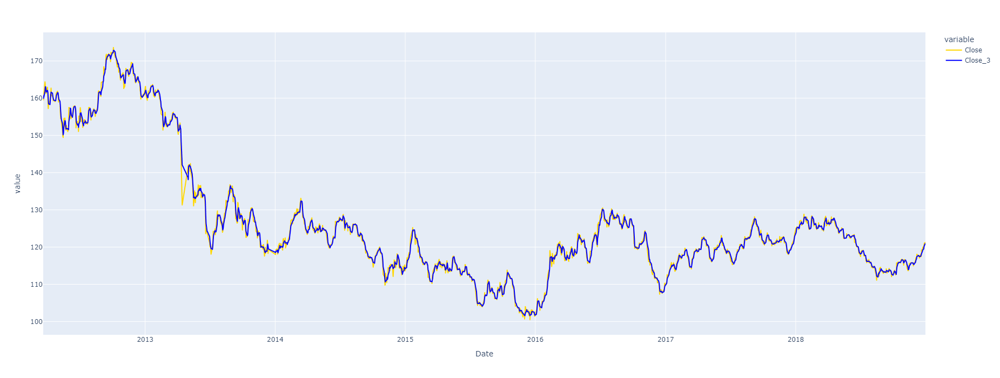

In [223]:
import plotly.express as px
import plotly.graph_objects as go

columns = ['Close',  'Close_3']

fig = px.line(
    df_selected,
    x=df_selected.index,
    y=columns,
    height=700,
    color_discrete_map={
        "Close": "gold",
        "Close_3": "blue",
    }
)

fig.show()

### 3.3.2 Plot die Spalten 'Close',  'Close_5'

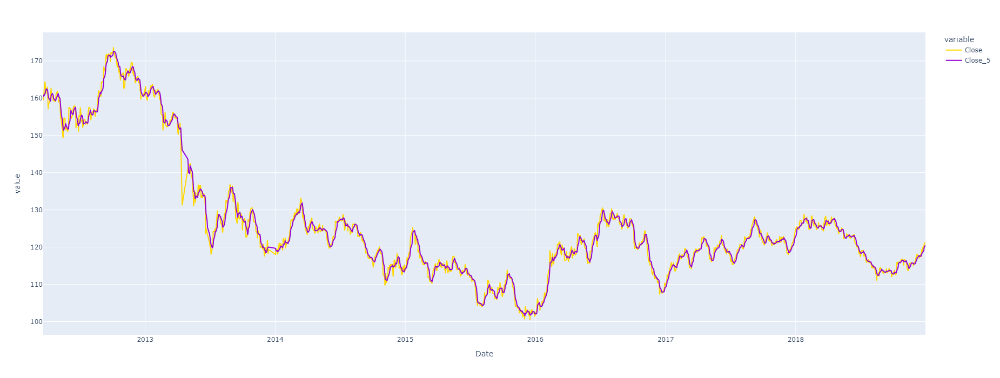

In [224]:
import plotly.express as px

columns = ['Close',  'Close_5']

fig = px.line(
    df_selected,
    x=df_selected.index,
    y=columns,
    height=700,
    color_discrete_map={
        "Close": "gold",
        "Close_5": "darkviolet",
    }
)

fig.show()

### 3.3.3 Plot die Spalten: ['Close', 'Close_5', 'Close_22', 'Close_65','y']

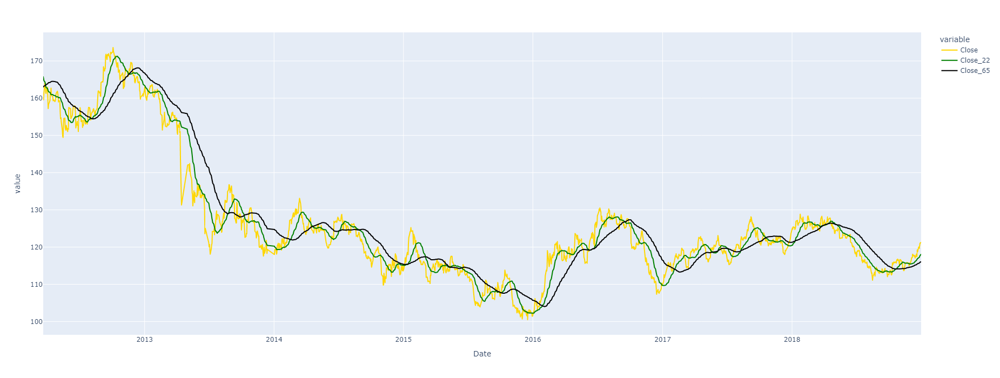

In [225]:
import plotly.express as px
columns = ['Close', 'Close_22', 'Close_65']
fig = px.line(
    df_selected,
    x=df_selected.index,
    y=columns,
    height=700,
    color_discrete_map={
        "Close": "gold",
        "Close_22": "green",
        "Close_65": "black",
        
    }
)

fig.show()


### 3.3.4 Plot ['Close',  'USDI_Price', 'GDX_Close'] und 'USB_Price' mit eigenem y-Achse wegen zu großem Wertunterschied

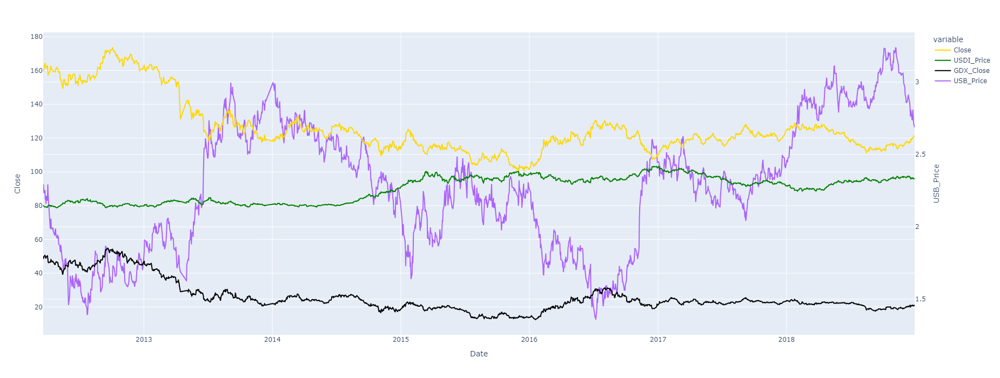

In [226]:
columns= ['Close',  'USDI_Price', 'GDX_Close']
#columns= ['Close', 'USB_Price', 'USDI_Price', 'GDX_Close'] # USB_Price too small to plot in the same diagram
fig = px.line(df_selected, x=df_selected.index, y=columns,
           height=700,
        color_discrete_map={
        "Close": "gold",
        "USB_Price": "red",
        "USDI_Price": "green",
        "GDX_Close": "black",
            }
             )

fig.add_trace(go.Scatter(
    x=df_selected.index,
    y=df_selected['USB_Price'],   
    mode="lines",
    name="USB_Price",
    yaxis="y2"                
))

fig.update_layout(
    yaxis=dict(title="Close"),
    yaxis2=dict(
        title="USB_Price",
        overlaying="y",
        side="right"   
    )
)

fig.show()

In [227]:
print(df_selected['USB_Price'].head(10))

Date
2012-03-21    2.296
2012-03-22    2.282
2012-03-23    2.233
2012-03-26    2.253
2012-03-27    2.187
2012-03-28    2.201
2012-03-29    2.159
2012-03-30    2.214
2012-04-02    2.180
2012-04-03    2.293
Name: USB_Price, dtype: float64


### 3.2.5 Plot 'DJ_close' mit eigener y-Achse

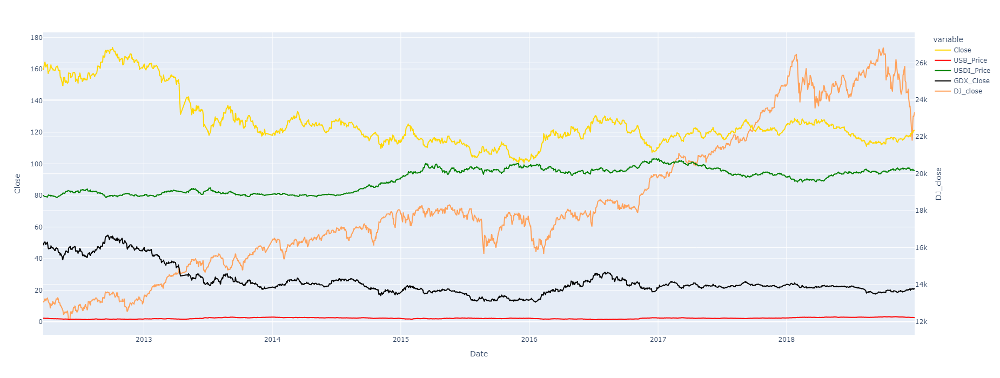

In [228]:
import plotly.graph_objects as go
columns= ['Close', 'USB_Price', 'USDI_Price', 'GDX_Close']
#fig = go.Figure()

fig = px.line(df_selected, x=df_selected.index, y=columns, height=700,
                     color_discrete_map={
        "Close": "gold",
        "USB_Price": "red",
        "USDI_Price": "green",
        "GDX_Close": "black",
            }
             )

fig.add_trace(go.Scatter(
    x=df_selected.index,
    y=df_selected['DJ_close'],   
    mode="lines",
    name="DJ_close",
    yaxis="y2"                
))

fig.update_layout(
    yaxis=dict(title="Close"),
    yaxis2=dict(
        title="DJ_close",
        overlaying="y",
        side="right"   
    )
)

fig.show()


In [229]:
print(df_selected['DJ_close'].head(10))

Date
2012-03-21    13124.62012
2012-03-22    13046.13965
2012-03-23    13080.73047
2012-03-26    13241.62988
2012-03-27    13197.73047
2012-03-28    13126.20996
2012-03-29    13145.82031
2012-03-30    13212.04004
2012-04-02    13264.49023
2012-04-03    13199.54981
Name: DJ_close, dtype: float64


# 4 Auswahl von Spaltenkombinationen für ML:

## 4.1  Funktion: shift_target(): die Zielspalte wird um anzahl_shift Zeilen noch oben verschoben
- df: Pandas Dataframe
- target = 'y': die Zielspalte
- anzahl_shift: die Zielspalte wird um diese Zeilen nach oben verschoben. 1: Morgen, 2: Übermorgen, 5: eine Woche voraus.

1. columns_of_interest_1 =  ['Close',             'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'  ]
2. columns_of_interest_2 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'  ]
3. columns_of_interest_3 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_3']
4. columns_of_interest_4 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_5']




### 4.1.1 Definition von Funktionen: shift_target()
Die Funktion verschiebt die Zielspalte um anzahl_shift-Zeilen nach oben.

In [230]:
def shift_target(df, zielspalte = 'y', anzahl_shift = 1):
    df.loc[:,zielspalte] = df[zielspalte].shift(-anzahl_shift) 
    df = df.dropna(axis=0) # durch shift entsteht Nan, hier löschen
    return df
    

### 4.1.2 Definition von Funktionen: shift_prediction()
Die Funktion verschiebt die Zielspalte um anzahl_shift-Zeilen nach unten, um die graphische Darstellung für die Zukunt zu veranschaulichen.

Nach der Verschibung ist die Voraussage und originalem True-Werte in der gleichen Zeile

**anzahl_shift**: Anzahl der Zeilen, die nach unten verschoben werden.

In [231]:
def shift_prediction(df, anzahl_shift = 1):
    last_date = df.index[-1]
    new_idx = pd.bdate_range(start=last_date + pd.Timedelta(days=1),
                             periods=anzahl_shift, freq="B")
    new_rows = pd.DataFrame(index=new_idx)
    df = pd.concat([df, new_rows])
    df.iloc[:,-1] = df.iloc[:,-1].shift(anzahl_shift)
    return df

### 4.1.3 Definition von Funktionen: plot_pred_close()
Die Funktion plots die "Close_n' Spalte und die Zielspalten, um die Voraussage zu veranschaulichen.

In [232]:
def plot_pred_close (df, last_values = None):

    if last_values is not None:
        df_show = df.iloc[-last_values:,:]
    else:
        df_show = df
        
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=df_show.index, y=df_show.iloc[:,0],
        mode='lines', name='real'
    ))

    fig.add_trace(go.Scatter(
        x=df_show.index, y=df_show.iloc[:,-1],
        mode='lines', name='predicted'
    ))
    
    fig.update_layout(
        #width=900,   # Breite
        height=600   # Höhe
       )
    fig.show()

### 4.1.4 Definition von Funktionen: plot_pred_close_diff()

In [233]:
def plot_pred_close_diff (df, last_values=None):
    # Falls last_values angegeben ist, nur die letzten Zeilen anzeigen
    if last_values is not None:
        df_show = df.iloc[-last_values:, :].copy()
    else:
        df_show = df.copy()
 
    # Neue Spalte: Differenz zwischen Vorhersage und Close
    if 'y_pred' in df_show.columns and 'Close' in df_show.columns:
        df_show['y_pred_close_diff'] = df_show['y_pred'] - df_show['Close']
        
    # Plot erstellen
    fig = go.Figure()
 
    # Realwerte
    fig.add_trace(go.Scatter(
        x=df_show.index, y=df_show['Close'],
        mode='lines', name='Close (real)'
    ))

    # Vorhersage
    if 'y_pred' in df_show.columns:
        fig.add_trace(go.Scatter(
            x=df_show.index, y=df_show['y_pred'],
            mode='lines', name='y_pred'
        ))
        
    if 'y_pred_close_diff' in df_show.columns:
        fig.add_trace(go.Scatter(
        x=df_show.index, y=df_show['y_pred_close_diff'],   
        mode="lines", name="y_pred_close_diff",
        yaxis="y2"                
        ))
        
    fig.update_layout(
        height=700,
        yaxis=dict(title="Close"),
        yaxis2=dict(
        title="y_pred_close_diff",
        overlaying="y",
        side="right"   
          )
        )

    fig.show()


## 4.2 Definition von columns und Datenvorbereitung¶

### 4.2.1 Datenvorbereitung: df1,df2,df3,df4 durch df_dict{} für Morgen 

In [234]:
pd.set_option("display.max_columns", 100)
df_selected.head()

,Close,DJ_close,USB_Price,USDI_Price,GDX_Close,y,Close_3,Close_5,Close_22,Close_65,DJ_close_3,DJ_close_5,DJ_close_22,DJ_close_65,USB_Price_3,USB_Price_5,USB_Price_22,USB_Price_65,USDI_Price_3,USDI_Price_5,USDI_Price_22,USDI_Price_65,GDX_Close_3,GDX_Close_5,GDX_Close_22,GDX_Close_65,y_3,y_5,y_22,y_65
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-03-21,160.210007,13124.62012,2.296,79.896,49.759998,160.210007,160.643336,160.862003,165.751365,163.014616,13177.980143,13203.864064,13023.119585,12690.581732,2.344667,2.3222,2.086727,1.988800,79.811000,79.8606,79.453318,79.878077,49.739999,49.857999,53.411364,53.718154,160.643336,160.862003,165.751365,163.014616
2012-03-22,159.570007,13046.13965,2.282,79.998,48.750000,159.570007,159.970006,160.560004,165.230910,163.126000,13113.650067,13162.540040,13026.776368,12708.694502,2.313667,2.3228,2.096773,1.994508,79.906333,79.8330,79.492500,79.872800,49.456666,49.579999,53.090000,53.673077,159.970006,160.560004,165.230910,163.126000
2012-03-23,161.529999,13080.73047,2.233,79.576,49.759998,161.529999,160.436671,160.606003,164.712274,163.222923,13083.830080,13132.162110,13033.233666,12727.376669,2.270333,2.3098,2.107273,2.000385,79.823333,79.8014,79.504909,79.862446,49.423332,49.545999,52.768636,53.628154,160.436671,160.606003,164.712274,163.222923
2012-03-26,164.399994,13241.62988,2.253,79.179,50.630001,164.399994,161.833333,161.168002,164.320455,163.369539,13122.833333,13132.662110,13044.912732,12750.074670,2.256000,2.2854,2.118955,2.007200,79.584333,79.6948,79.518227,79.846631,49.713333,49.752000,52.467273,53.619846,161.833333,161.168002,164.320455,163.369539
2012-03-27,163.240005,13197.73047,2.187,79.222,49.910000,163.240005,163.056666,161.790002,163.911819,163.465847,13173.363607,13138.170118,13054.675471,12766.907753,2.224333,2.2502,2.128500,2.011200,79.325667,79.5742,79.555545,79.830462,50.100000,49.761999,52.169545,53.572462,163.056666,161.790002,163.911819,163.465847


### DataFrame für verschiedenen Kombinationen erzeugen
- columns_of_interest_1 =  ['Close',             'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'  ]
- columns_of_interest_2 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'  ]
- columns_of_interest_3 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_3']
- columns_of_interest_4 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_5']

df1 = df_selected[columns_of_interest_1].copy()
df1= shift_target(df1, 'y', anzahl_shift = 1)    # für morgen

df2 = df_selected[columns_of_interest_2].copy()
df2 = shift_target(df2, 'y', anzahl_shift = 1)    # für morgen

df3 = df_selected[columns_of_interest_3].copy()
df3 = shift_target(df3, 'y_3', anzahl_shift = 1)    # für morgen

df4 = df_selected[columns_of_interest_4].copy()
df4= shift_target(df4, 'y_5', anzahl_shift = 1)   # für übermorgen


In [235]:
# Zielspalte wird um  anzahl_shift= Anzahl_derZeilen verschoben:
### Close + y → klassische punktgenaue Vorhersage
### Close + Close_22 + y → klassische punktgenaue Vorhersage mit zusätzlicher Information aus Close_22
### Close + Close_22 + y_3 → Trendvorhersage für 3 Tage (gegünstigt bei moderaten Schwankungen)
### Close + Close_22 + y_5 → Trendvorhersage für 5 Tage (gegünstigt bei moderaten Schwankungen)


dict_columns_of_interest= { 
"Close DJ_close  USB_Price USDI_Price GDX_Close y":             ['Close',              'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',   'y'   ],
"Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y":    ['Close',  'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'   ],
"Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3":  ['Close',  'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_3' ],
"Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5":  ['Close',  'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_5' ], 
}

anzahl_shift= 1
target_list= ['y', 'y', 'y_3','y_5']
df_dict={}
df_list=[]
for i, (key, columns) in enumerate( dict_columns_of_interest.items()):    
    df_dict[key]= df_selected[columns].copy()  # key1= "Close + y": value= df1,  key1= "Close + Close_22 + y": value= df2 ...
    df_dict[key]= shift_target(df_dict[key], target_list[i], anzahl_shift ) # für morgen
    df_list.append(df_dict[key]) # Vorbereitung für Benutzung später
    print(df_dict[key].head().to_string())
    
#print(df_dict)

                 Close     DJ_close  USB_Price  USDI_Price  GDX_Close           y
Date                                                                             
2012-03-21  160.210007  13124.62012      2.296      79.896  49.759998  159.570007
2012-03-22  159.570007  13046.13965      2.282      79.998  48.750000  161.529999
2012-03-23  161.529999  13080.73047      2.233      79.576  49.759998  164.399994
2012-03-26  164.399994  13241.62988      2.253      79.179  50.630001  163.240005
2012-03-27  163.240005  13197.73047      2.187      79.222  49.910000  161.509995
                 Close    Close_22     DJ_close  USB_Price  USDI_Price  GDX_Close           y
Date                                                                                         
2012-03-21  160.210007  165.751365  13124.62012      2.296      79.896  49.759998  159.570007
2012-03-22  159.570007  165.230910  13046.13965      2.282      79.998  48.750000  161.529999
2012-03-23  161.529999  164.712274  13080.73047   

## 2.3 Splitten von Zeitreihendaten

 Benutzung von TimeSeriesSplit für das Splitten von Zeitreihendaten:

 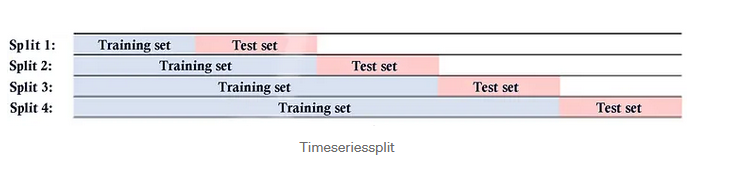

# 5 LinearRegression(): mit StandardScaler(), MinMaxScaler(), RobustScaler(), Ohne Scalar
Die Ergebnisse mit oder ohne Scalar sind gleich. warum: Vermutung: die Spalt 'Close' ist sehr dominate dass die anderen Splaten nur sehr kleinen Einfluss haben.¶
### Pandas DataFrame to Numpy array

dict_columns_of_interest= { 
- "Close  y":             ['Close',              'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',   'y'   ], 
- "Close  Close_22  y":   ['Close',  'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'   ],
- "Close  Close_22  y_3": ['Close',  'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_3' ],
- "Close  Close_22  y_5": ['Close',  'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_5' ],
- 

df_list hat 4 DataFrames jeweils aus einer  Spaltenkombination wie oben.

Pandas DataFrame to Numpy array: Beispiel

df_np =  df.iloc[0:-1].to_numpy() # bis zur letzten Zeile 

X_last = df.iloc[:,0:-1].tail(1).to_numpy()  # letzte  Zeile als Testzeile


## 5.1 Vorbereitung von Trainingsdaten und Testdaten
### df_dict -> np_dict

In [236]:
# Vorbereitung von Trainingsdaten und Testdaten
# Pandas DataFrame to Numpy array
anzahl_shift=1  # 1: Voraussage für Morgen; 2: Voraussage bigenned mit Übermorgen( in der Regel nicht angewendet)
X_last=[]      # die letzte anzahl_shift Zeilen für Testing
np_dict= {}    #  aus df_dict{}
for key, df in  df_dict.items():
    np_dict[key]= df.iloc[0:-anzahl_shift].to_numpy() # bis anzahl_shift vor dem Zeilenende: z.B. anzahl_shift=1, bis vorletzte Zeile
    X_last.append( df.iloc[:,0:-1].tail(anzahl_shift).to_numpy()) # letzte Zeile ohne letzte Spalte    
    np_val= np_dict[key]
    #print(np_val[0:2])
    #print("last_x", X_last)




## 5.2 TimeSeriesSplit(n_splits=5) + Scalar + LinearRegression()

In [237]:
from sklearn.model_selection import TimeSeriesSplit

df_plot_dict={}
tscv = TimeSeriesSplit(n_splits=5)
linreg = LinearRegression()
myscalar_list= [StandardScaler(), MinMaxScaler(), RobustScaler(), None]

### Close + y → klassische punktgenaue Vorhersage
### Close + Close_22 + y → klassische punktgenaue Vorhersage mit zusätzlicher Information aus Close_22
### Close + Close_22 + y_3 → Trendvorhersage für 3 Tage (gegünstigt bei moderaten Schwankungen)
### Close + Close_22 + y_5 → Trendvorhersage für 5 Tage (gegünstigt bei moderaten Schwankungen)

#dataset_list=[", Close + y, ", ", Close + Close_22 + y, ", ", Close + Close_22 + y_3, "]

print(f"Split: r2_train/r2_test/mape_train/mape_test/rmse_train/rmse_test/ most important column") 
print("===============================================================================: " )
test_zeile=200
for k,  myscalar in enumerate(myscalar_list):
 #print(f"===>{myscalar}")    
 for j, (key, np_arr) in  enumerate( np_dict.items() ):     
  print(f" {myscalar}, {key}")     
  X_train_selected = np_arr[:-test_zeile]  # nur bis die letzten test_zeile= z.B. 300 Zeilen auswählen
  X_test_selected = np_arr[-test_zeile:, :-1]  # die letzten test_zeile= z.B. 300 Zeilen für echten Test
  y_test_selected = np_arr[-test_zeile:,  -1]    
  for i, (train_index, test_index) in enumerate (tscv.split(X_train_selected)):
    X_train, X_test = X_train_selected[train_index,0:-1], X_train_selected[test_index,0:-1]
    y_train, y_test = X_train_selected[train_index,-1], X_train_selected[test_index,-1]
    #scaler= MinMaxScaler()
    #scaler = StandardScaler()
    #scaler= RobustScaler()
    
    if myscalar is None:
        #print("Kein Scaler")
        X_train_new = X_train
        X_test_new = X_test
    else:
        X_train_new = myscalar.fit_transform(X_train)
        X_test_new  = myscalar.transform(X_test)
        
    #scalar_name=  myscalar_list[k].__class__.__name__

    linreg.fit(X_train_new, y_train)
    y_pred_train = linreg.predict(X_train_new)
    y_pred_test = linreg.predict(X_test_new)
    
      
    #print("=============================: y_pred_train " )
    #print(y_pred_train[0:10])
    #print("=============================: y_pred_test " )
    #print(y_pred_test[0:10])

    score_train_ = r2_score(y_train, y_pred_train)
    score_test_ = r2_score(y_test, y_pred_test)
    
    mape_score_train= mean_absolute_percentage_error(y_train, y_pred_train)
    mape_score_test= mean_absolute_percentage_error(y_test, y_pred_test)
    rmse_score_train= root_mean_squared_error(y_train, y_pred_train)
    rmse_score_test= root_mean_squared_error(y_test, y_pred_test)


    coef = linreg.coef_
    index_max = np.argmax(coef)
    intercept = linreg.intercept_
    # print(index_max)
    #print(f"===>  Split {i}:")

    #print(f"# r2_train/r2_test/mape_train/mape_test/rmse_train/rmse_test/ most important column") 
    print(f"{i}: {score_train_:.3f},  {score_test_:.3f},  {mape_score_train:.3f},  {mape_score_test:.3f},  {rmse_score_train:.3f},  {rmse_score_test:.3f}, {df_list[j].columns[index_max]}")
    
    # Kombination:  StandardScaler() + 4-split 
    # Close + y, Close + Close_22+ y, Close + Close_22+ y_3, Close + Close_22+ y_5 ( 4 DataFframe)
    #target_list= ['y', 'y', 'y_3','y_5'] 
    if k==0 and i== 4: 
        X_test_selected_new  = myscalar.transform(X_test_selected)
        y_test_selected_pred = linreg.predict(X_test_selected_new)
        
        df_plot_dict[key] = df_list[j][['Close', target_list[j]]].copy()
        df_plot_dict[key]['y_pred'] = df_plot_dict[key][target_list[j]].copy()  # Originalwert kopieren
        df_plot_dict[key].loc[df_plot_dict[key].index[-test_zeile:], 'y_pred'] = y_test_selected_pred
        rmse = root_mean_squared_error(y_test_selected, y_test_selected_pred)
        mape = mean_absolute_percentage_error(y_test_selected, y_test_selected_pred)
        print(f" rmse: {rmse:.3f}, mape:  {mape*100.0:.3f}%")
 

Split: r2_train/r2_test/mape_train/mape_test/rmse_train/rmse_test/ most important column
===============================================================================: 
 StandardScaler(), Close DJ_close  USB_Price USDI_Price GDX_Close y
0: 0.949,  0.950,  0.006,  0.011,  1.319,  1.982, Close
1: 0.991,  0.928,  0.008,  0.008,  1.623,  1.315, Close
2: 0.994,  0.960,  0.008,  0.008,  1.479,  1.073, Close
3: 0.995,  0.963,  0.007,  0.007,  1.385,  1.099, Close
4: 0.995,  0.840,  0.007,  0.008,  1.329,  1.242, Close
 rmse: 1.458, mape:  1.088%
 StandardScaler(), Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y
0: 0.950,  0.945,  0.006,  0.012,  1.317,  2.082, Close
1: 0.991,  0.927,  0.008,  0.009,  1.621,  1.328, Close
2: 0.994,  0.960,  0.008,  0.008,  1.479,  1.072, Close
3: 0.995,  0.963,  0.007,  0.007,  1.385,  1.097, Close
4: 0.995,  0.841,  0.007,  0.008,  1.329,  1.236, Close
 rmse: 1.447, mape:  1.078%
 StandardScaler(), Close Close_22  DJ_close USB_Price USDI_Price GDX

## 5.3 Plot die Voraussage

 Plot für Spaltenkombination + StandardScaler() : Close DJ_close  USB_Price USDI_Price GDX_Close y


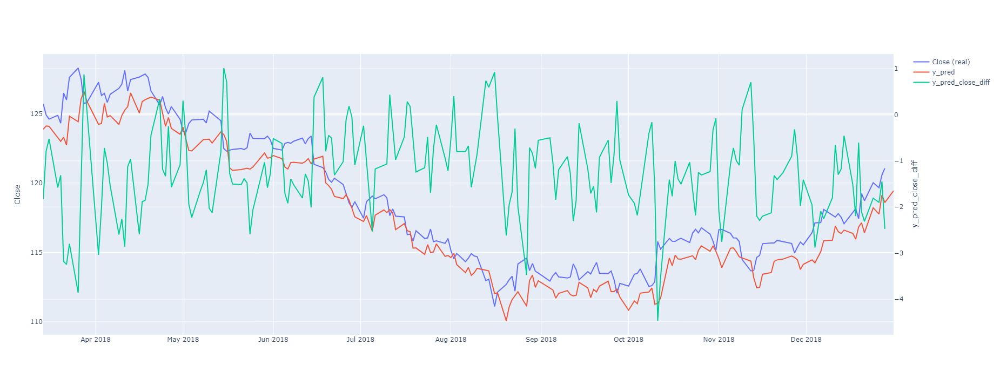

 Plot für Spaltenkombination + StandardScaler() : Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y


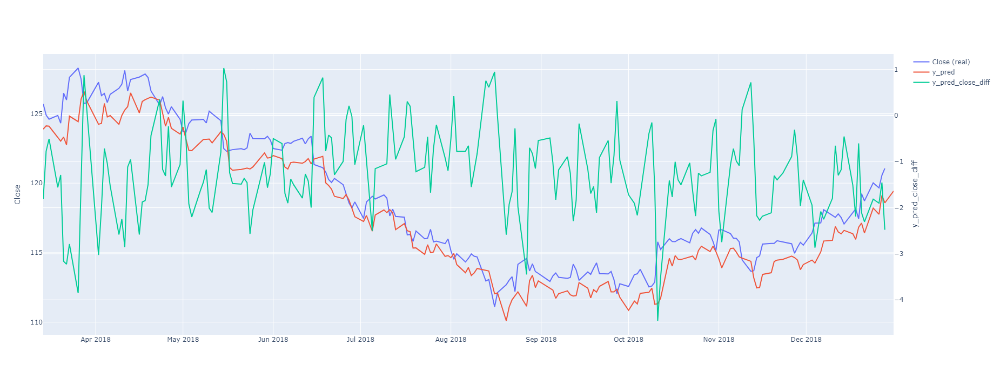

 Plot für Spaltenkombination + StandardScaler() : Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3


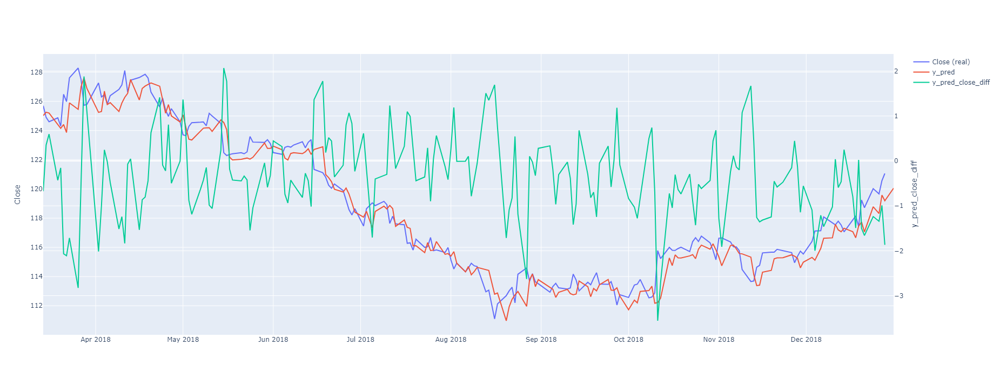

 Plot für Spaltenkombination + StandardScaler() : Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5


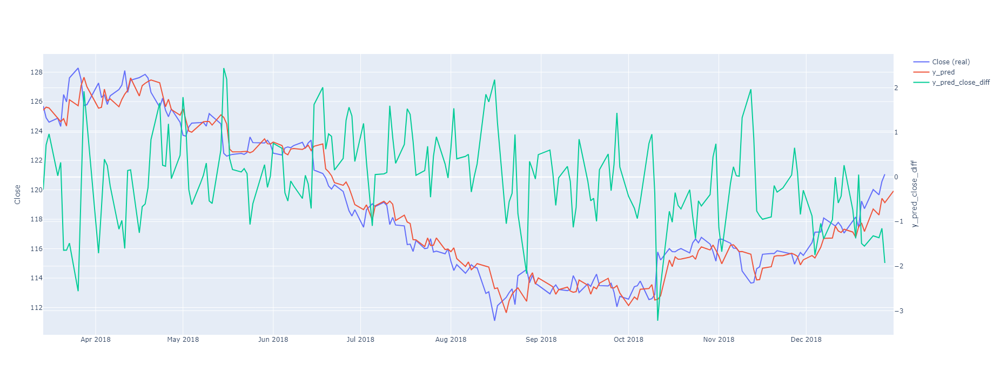

In [238]:
import plotly.graph_objects as go

# anzahl_shift=1
for j, (key, df) in  enumerate( df_plot_dict.items() ):
  print(f" Plot für Spaltenkombination + StandardScaler() : {key}") 
  df_plot= shift_prediction (df, anzahl_shift) # erzeugen1 neue Zeilen mit Datum als index
  #plot_prediction(df_plot, 300)
  plot_pred_close_diff (df_plot, test_zeile)



    

# 6 SVR:   mit StandardScaler(),  MinMaxScaler(), RobustScaler() 
## Auswahl von Datensatz wie bei LinearRegression():
- df: Pandas Dataframe
- target = 'y': die Zielspalte
- anzahl_shift: die Zielspalte wird um diese Zeilen nach oben verschoben. 1: Morgen, 2: Übermorgen, 5: eine Woche voraus.

1. columns_of_interest_1 =  ['Close',             'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'  ]
2. columns_of_interest_2 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y'  ]
3. columns_of_interest_3 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_3']
4. columns_of_interest_4 =  ['Close', 'Close_22', 'DJ_close', 'USB_Price', 'USDI_Price', 'GDX_Close',  'y_5']


## 6.1 Auswahl von Score: r2_score, mean_absolute_percentage_error, root_mean_squared_error
## 6.2 Auswahl von StandardScaler(),  MinMaxScaler(), RobustScaler() 
Begründung: 

„Support-Vector-Machine-Algorithmen sind nicht skaleninvariant weil diese distanzbasiert arbeiten . Daher ist es nötig, die Daten vorher zu skalieren.“

**Allgemein:**
Vor SVR, SVM, k-NN, PCA, neuronalen Netzen → immer skalieren (StandardScaler , MinMaxScaler, RobustScaler() ).

Nur bei baumbasierten Methoden (z. B. DecisionTree, RandomForest, XGBoost) ist Skalierung nicht nötig, weil diese nicht distanzbasiert arbeiten.

**Ergebnis**: 
 1. RobustScaler() und StandardScaler() liefern nahezu identische Ergebnisse, wobei RobustScaler() leicht überlegen ist. MinMaxScaler() schneidet dagegen etwas schlechter ab.
 2. Das Ergebnis von SVR() ist fast gleich gut wie bei LinearRegression() weil die beiden lineares Modell benutzen.

## 6.3 Ausführung von SVR()

In [239]:

df_plot_dict={}
tscv = TimeSeriesSplit(n_splits=5)

mysvr= SVR(kernel='linear', C=1.0)  # kernel=‘poly’, ‘rbf’, ‘sigmoid’: schon ausprobiert, nicht so gut wie 'linear'
myscalar_list= [StandardScaler(), MinMaxScaler(), RobustScaler() ] # svr braucht eine Skalierung
#myscalar_list= [StandardScaler(), None]

### Close + y → klassische punktgenaue Vorhersage
### Close + Close_22 + y → klassische punktgenaue Vorhersage mit zusätzlicher Information aus Close_22
### Close + Close_22 + y_3 → Trendvorhersage für 3 Tage (gegünstigt bei moderaten Schwankungen)
### Close + Close_22 + y_5 → Trendvorhersage für 5 Tage (gegünstigt bei moderaten Schwankungen)

print(f"Split: r2_train/r2_test/mape_train/mape_test/rmse_train/rmse_test/ most important column") 
print("===============================================================================: " )

test_zeile=200

for k,  myscalar in enumerate(myscalar_list):
 for j, (key, np_arr) in  enumerate( np_dict.items() ):
  print(f" {myscalar}, {key}")     
  X_train_selected = np_arr[:-test_zeile]  # nur bis die letzten test_zeile= z.B. 300 Zeilen auswählen
  X_test_selected = np_arr[-test_zeile:, :-1]  # die letzten test_zeile= z.B. 300 Zeilen für echten Test
  y_test_selected = np_arr[-test_zeile:,  -1]            

  for i, (train_index, test_index) in enumerate (tscv.split(X_train_selected)):
    X_train, X_test = X_train_selected[train_index,0:-1], X_train_selected[test_index,0:-1]
    y_train, y_test = X_train_selected[train_index,-1], X_train_selected[test_index,-1]

    if myscalar is None:
        #print("Kein Scaler")
        X_train_new = X_train
        X_test_new = X_test
    else:
        X_train_new = myscalar.fit_transform(X_train)
        X_test_new  = myscalar.transform(X_test)
        

    mysvr.fit(X_train_new, y_train)
    y_pred_train = mysvr.predict(X_train_new)
    y_pred_test  = mysvr.predict(X_test_new)

    score_train = r2_score(y_train, y_pred_train)
    score_test  = r2_score(y_test, y_pred_test)
    
    mape_score_train = mean_absolute_percentage_error(y_train, y_pred_train)
    mape_score_test  = mean_absolute_percentage_error(y_test, y_pred_test)
    rmse_score_train = root_mean_squared_error(y_train, y_pred_train)
    rmse_score_test  = root_mean_squared_error(y_test, y_pred_test)

    coef = mysvr.coef_
    index_max = np.argmax(coef)
    intercept = mysvr.intercept_
      
    #print(f"# r2_train/r2_test/mape_train/mape_test/rmse_train/rmse_test/ most important column") 
    print(f"{i}: {score_train:.3f},  {score_test:.3f},  {mape_score_train:.3f},  {mape_score_test:.3f},  {rmse_score_train:.3f},  {rmse_score_test:.3f}, {df_list[j].columns[index_max]}")

    # Kombination:  StandardScaler() + 4-split 
    # Close + y, Close + Close_22+ y, Close + Close_22+ y_3, Close + Close_22+ y_5 ( 4 DataFframe)
    #target_list= ['y', 'y', 'y_3','y_5'] 
      
    if k==0 and i== 4: 
        X_test_selected_new  = myscalar.transform(X_test_selected)
        y_test_selected_pred = mysvr.predict(X_test_selected_new)
        
        df_plot_dict[key] = df_list[j][['Close', target_list[j]]].copy()
        df_plot_dict[key]['y_pred'] = df_plot_dict[key][target_list[j]].copy()  # Originalwert kopieren
        df_plot_dict[key].loc[df_plot_dict[key].index[-test_zeile:], 'y_pred'] = y_test_selected_pred
        rmse = root_mean_squared_error(y_test_selected, y_test_selected_pred)
        mape = mean_absolute_percentage_error(y_test_selected, y_test_selected_pred)
        print(f" rmse: {rmse:.3f}, mape:  {mape*100.0:.3f}%")

        

Split: r2_train/r2_test/mape_train/mape_test/rmse_train/rmse_test/ most important column
===============================================================================: 
 StandardScaler(), Close DJ_close  USB_Price USDI_Price GDX_Close y
0: 0.948,  0.935,  0.006,  0.013,  1.333,  2.273, Close
1: 0.991,  0.915,  0.008,  0.010,  1.632,  1.428, Close
2: 0.994,  0.962,  0.008,  0.007,  1.482,  1.051, Close
3: 0.995,  0.964,  0.007,  0.007,  1.389,  1.086, Close
4: 0.995,  0.854,  0.007,  0.008,  1.333,  1.187, Close
 rmse: 1.347, mape:  0.982%
 StandardScaler(), Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y
0: 0.948,  0.949,  0.006,  0.011,  1.332,  2.013, Close
1: 0.991,  0.903,  0.008,  0.010,  1.641,  1.528, Close
2: 0.994,  0.959,  0.008,  0.007,  1.489,  1.093, Close
3: 0.995,  0.963,  0.008,  0.007,  1.395,  1.097, Close
4: 0.995,  0.873,  0.007,  0.007,  1.336,  1.107, Close
 rmse: 1.223, mape:  0.873%
 StandardScaler(), Close Close_22  DJ_close USB_Price USDI_Price GDX

## 6.4 Plots

 Plot für Spaltenkombination + StandardScaler(): Close DJ_close  USB_Price USDI_Price GDX_Close y


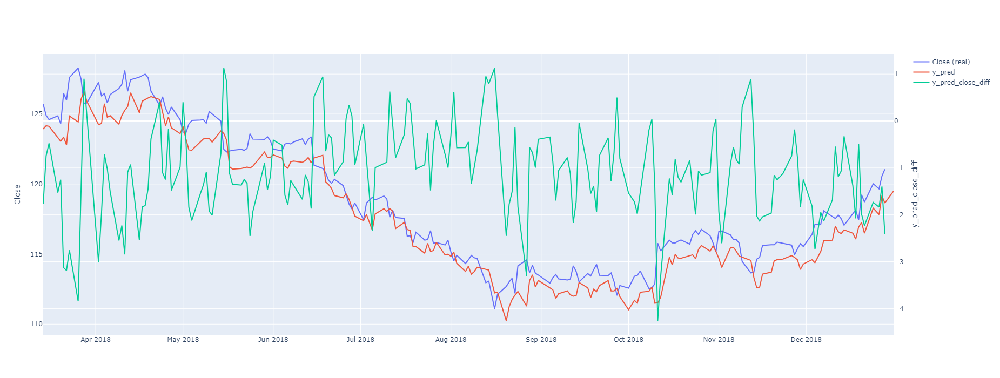

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y


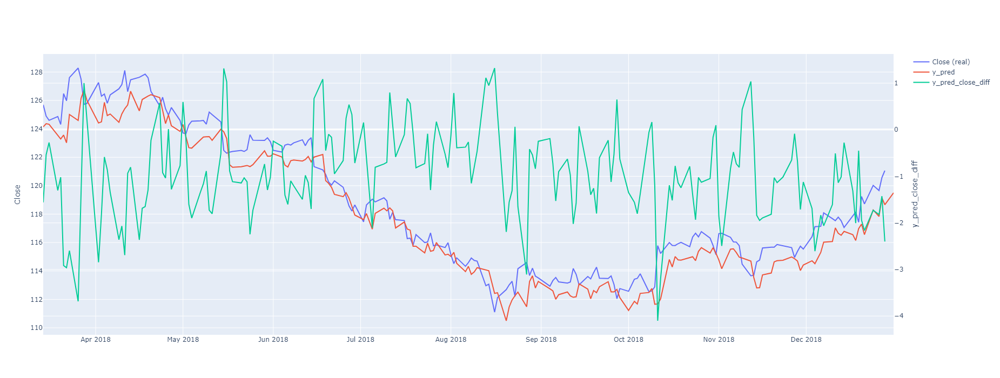

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3


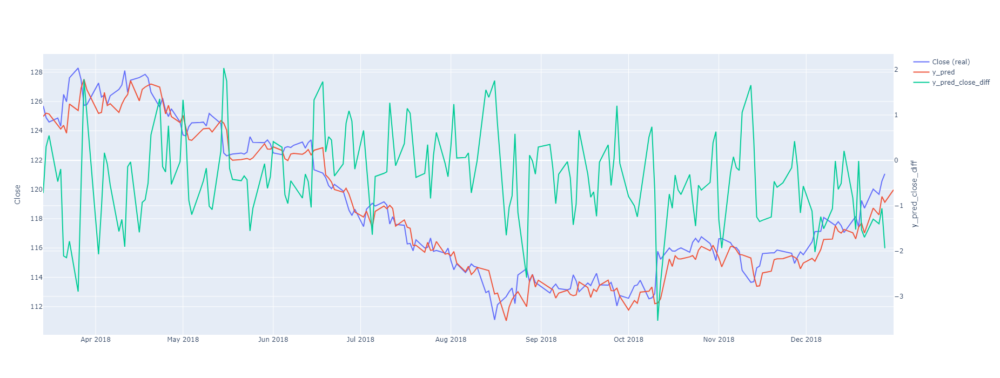

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5


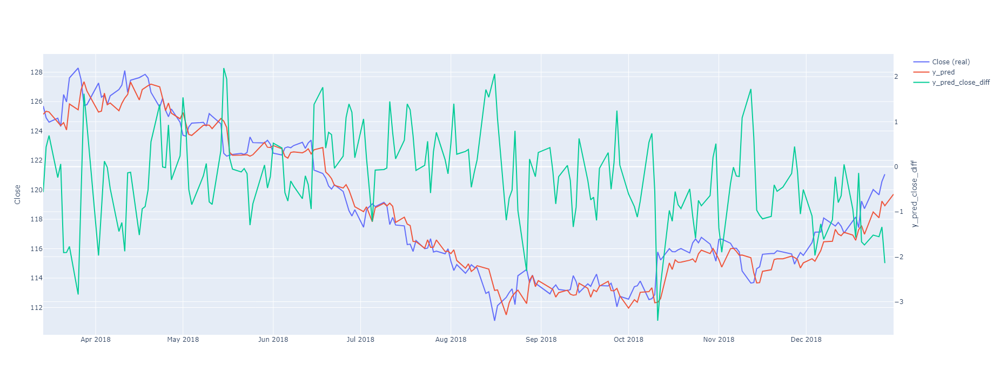

In [240]:
import plotly.graph_objects as go

# anzahl_shift=1
for j, (key, df) in  enumerate( df_plot_dict.items() ):
  print(f" Plot für Spaltenkombination + StandardScaler(): {key}") 
  df_plot= shift_prediction (df, 1) # erzeugen1 neue Zeilen mit Datum als index

  plot_pred_close_diff (df_plot, test_zeile)



# 7 DecisionTreeRegressor

**GridSearchCV()** sucht nach dem besten Baum.

## mögliche Scores:
"r2" → Bestimmtheitsmaß (Standard bei Regressoren).

"neg_mean_absolute_error" → negatives MAE.

"neg_mean_squared_error" → negatives MSE.

"neg_root_mean_squared_error" → negatives RMSE.

"neg_mean_squared_log_error" → MSLE.

"neg_median_absolute_error" → Median der absoluten Fehler.

AE (neg_mean_absolute_error) → gut interpretierbar in Originaleinheiten (z. B. Dollar).

RMSE (neg_root_mean_squared_error) → bestraft große Ausreißer stärker.
## Ausgewähltes Score:  mean_absolute_percentage_error
MAPE → prozentuale Fehler, leicht interpretierbar.

## 7.1 DecisionTreeRegressor()

In [241]:
# TimeSeriesSplit für Zeitreihendaten
tscv = TimeSeriesSplit(n_splits=5)

# Modellwahl (z. B. DecisionTree)
dt = DecisionTreeRegressor(random_state=42)

best_models = {}
# Parameter-Raster
param_grid_dt = {
    'max_depth': [3, 5, 10],
    'min_samples_split': [3, 5, 10]
}

# GridSearchCV mit Zeitreihen-CV
mape_scorer = make_scorer(mean_absolute_percentage_error, greater_is_better=False)

grid_search_dt = GridSearchCV(
    dt,
    param_grid=param_grid_dt,
    cv=tscv,
    scoring= 'neg_root_mean_squared_error' ,  # z.B. scoring= mape_scorer, 'neg_root_mean_squared_error'
    return_train_score=True
)

print(f"==========================================================")
print(f"Bestes Modell,  Beste Parameter,  CV-RMSE (durchschnittlich über Splits) ) ")
print(f"RMSE ,    MAPE für Testdaten ")
print(f"==========================================================")

test_zeile=300
for j, (key, np_arr) in  enumerate( np_dict.items() ):
    X_train= np_arr[:-test_zeile, :-1]  # nur bis die letzten test_zeile= z.B. 300 Zeilen 
    y_train= np_arr[:-test_zeile,  -1]    
    X_test= np_arr[-test_zeile:, :-1]  # die letzten test_zeile= z.B. 300 Zeilen für echten Test
    y_test= np_arr[-test_zeile:,  -1]
       
    grid_search_dt.fit(X_train, y_train)
    best_models[key] = grid_search_dt.best_estimator_
    
    best_model=  grid_search_dt.best_estimator_
    y_test_pred = best_model.predict(X_test)
    
    rmse = root_mean_squared_error(y_test, y_test_pred)
    mape = mean_absolute_percentage_error(y_test, y_test_pred)

    
    #target_list= ['y', 'y', 'y_3','y_5']              
    #df_plot_dict[key] = df_list[i][['Close', target_list[i]]].copy()# df (3 Spalten) für plot erzeugen       
    #df_plot_dict[key]['y_pred'] = df_plot_dict[key].iloc[:, -1].copy()       
    #df_plot_dict[key].iloc[-test_zeile:, -1] = y_test_pred

    #plots vorbereiten
    df_plot_dict[key] = df_list[j][['Close', target_list[j]]].copy()
    df_plot_dict[key]['y_pred'] = df_plot_dict[key][target_list[j]].copy()  # Originalwert kopieren
    df_plot_dict[key].loc[df_plot_dict[key].index[-test_zeile:], 'y_pred'] = y_test_pred
    

        
    
    print(f"=>  {key}")
    print(f" {best_model}, {grid_search_dt.best_params_},  {-grid_search_dt.best_score_:.3f} ")
    print(f" {rmse:.3f},   {mape*100.0:.3f}%")


Bestes Modell,  Beste Parameter,  CV-RMSE (durchschnittlich über Splits) ) 
RMSE ,    MAPE für Testdaten 
=>  Close DJ_close  USB_Price USDI_Price GDX_Close y
 DecisionTreeRegressor(max_depth=5, min_samples_split=10, random_state=42), {'max_depth': 5, 'min_samples_split': 10},  6.800 
 0.967,   0.643%
=>  Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y
 DecisionTreeRegressor(max_depth=5, min_samples_split=10, random_state=42), {'max_depth': 5, 'min_samples_split': 10},  6.886 
 0.967,   0.643%
=>  Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3
 DecisionTreeRegressor(max_depth=5, min_samples_split=3, random_state=42), {'max_depth': 5, 'min_samples_split': 3},  6.245 
 0.721,   0.506%
=>  Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5
 DecisionTreeRegressor(max_depth=10, min_samples_split=5, random_state=42), {'max_depth': 10, 'min_samples_split': 5},  6.822 
 1.051,   0.619%


## 7.2 Plots

 Plot für Spaltenkombination + StandardScaler(): Close DJ_close  USB_Price USDI_Price GDX_Close y


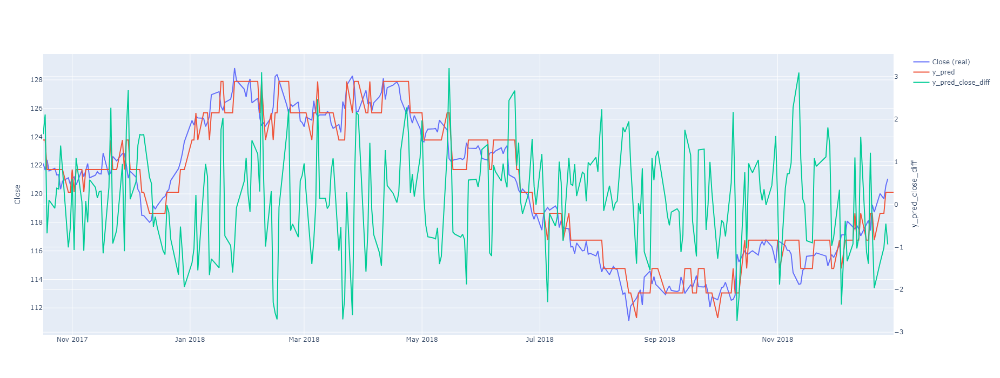

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y


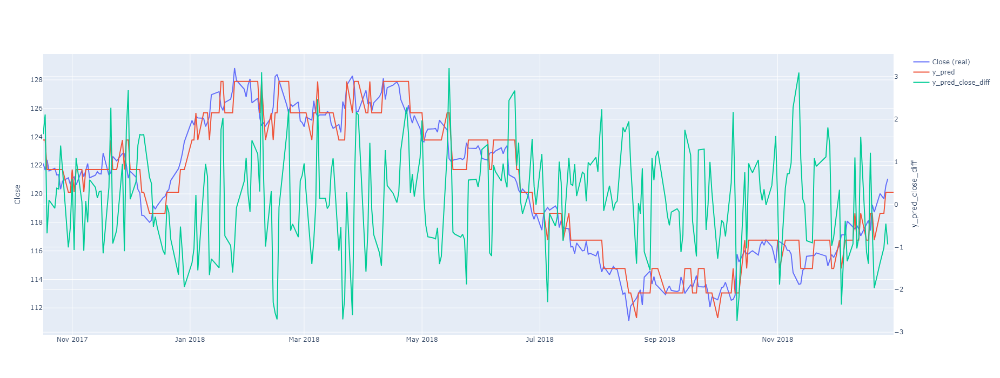

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3


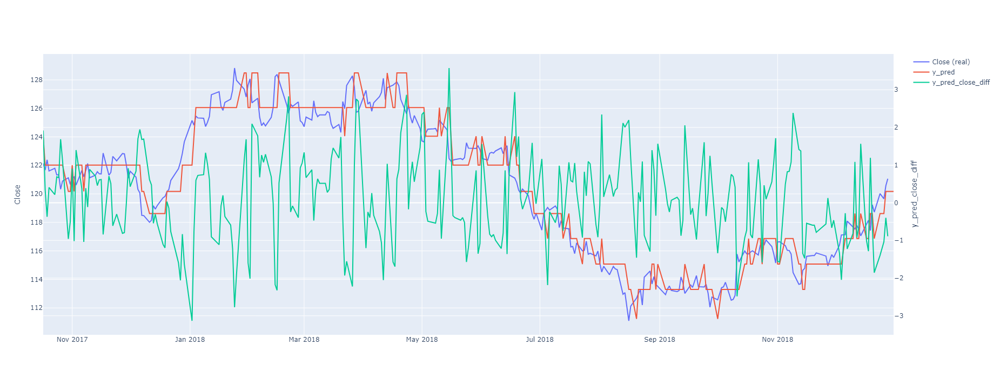

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5


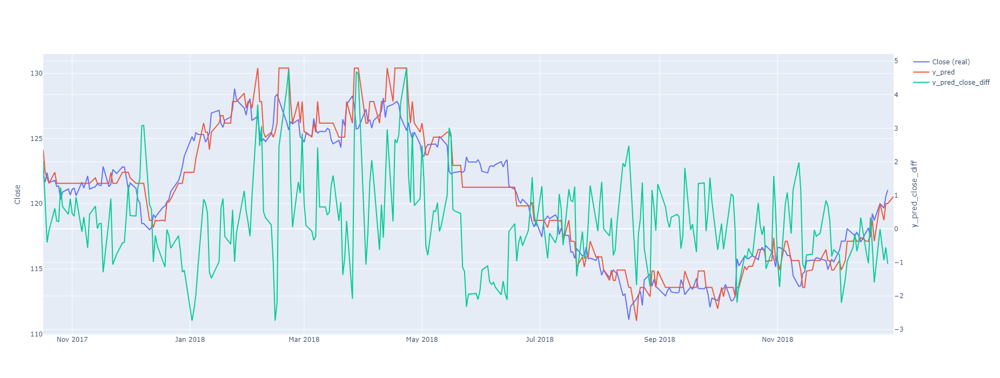

In [242]:
import plotly.graph_objects as go

# anzahl_shift=1
for j, (key, df) in  enumerate( df_plot_dict.items() ):
  print(f" Plot für Spaltenkombination + StandardScaler(): {key}") 
  df_plot= shift_prediction (df, 1) # erzeugen1 neue Zeilen mit Datum als index
  #plot_prediction(df_plot, 300)
  plot_pred_close_diff (df_plot, test_zeile)


# 8 RandomForestRegressor()
**Ergebis:**

Sowohl der DecisionTreeRegressor() als auch der RandomForestRegressor() lieferten gute Ergebnisse, wobei der RandomForestRegressor() leicht besser abschnitt.“

## 8.1 Durchführung von RandomForestRegressor()

In [243]:
tscv = TimeSeriesSplit(n_splits=5)
rf = RandomForestRegressor(random_state=42)

param_grid_rf = {
    'n_estimators': [50, 65, 100],
    'max_features': [2, 4, 6]
}

best_models = {}

grid_search_rf = GridSearchCV(
    rf,
    param_grid=param_grid_rf,
    cv=tscv,
    scoring='neg_root_mean_squared_error', #scoring= mape_scorer, 'neg_root_mean_squared_error'
    return_train_score=True
)

print(f"==========================================================")
print(f"Bestes Modell,  Beste Parameter,  CV-RMSE (durchschnittlich über Splits) ) ")
print(f"RMSE ,    MAPE     für Testdaten ")
print(f"==========================================================")
#test_zeile=300
for i, (key, np_arr) in  enumerate( np_dict.items() ):
    X_train= np_arr[:-test_zeile, :-1]  # nur bis die letzten 200 Zeilen 
    y_train= np_arr[:-test_zeile,  -1]    
    X_test= np_arr[-test_zeile:, :-1]  # die letzten 200 Zeilen für echten Test
    y_test= np_arr[-test_zeile:,  -1]
    
    grid_search_rf.fit(X_train, y_train)
    best_models[key] = grid_search_rf.best_estimator_
    best_model=  grid_search_rf.best_estimator_
    y_test_pred = best_model.predict(X_test)

    
    rmse = root_mean_squared_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_test_pred)    

    
    #plots vorbereiten
    
    df_plot_dict[key] = df_list[j][['Close', target_list[j]]].copy()
    df_plot_dict[key]['y_pred'] = df_plot_dict[key][target_list[j]].copy()  # Originalwert kopieren
    df_plot_dict[key].loc[df_plot_dict[key].index[-test_zeile:], 'y_pred'] = y_test_pred


    
    print(f"=>  {key}")
    print(f" {best_model}, {grid_search_dt.best_params_},  {-grid_search_dt.best_score_:.3f} ")
    print(f" {rmse:.3f},   {mape*100.0:.3f}%")

    

Bestes Modell,  Beste Parameter,  CV-RMSE (durchschnittlich über Splits) ) 
RMSE ,    MAPE     für Testdaten 
=>  Close DJ_close  USB_Price USDI_Price GDX_Close y
 RandomForestRegressor(max_features=6, random_state=42), {'max_depth': 10, 'min_samples_split': 5},  6.822 
 0.920,   0.553%
=>  Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y
 RandomForestRegressor(max_features=6, random_state=42), {'max_depth': 10, 'min_samples_split': 5},  6.822 
 0.920,   0.588%
=>  Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3
 RandomForestRegressor(max_features=6, n_estimators=50, random_state=42), {'max_depth': 10, 'min_samples_split': 5},  6.822 
 0.637,   0.297%
=>  Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5
 RandomForestRegressor(max_features=6, n_estimators=65, random_state=42), {'max_depth': 10, 'min_samples_split': 5},  6.822 
 0.730,   0.435%


### 8.1 Plots

 Plot für Spaltenkombination + StandardScaler(): Close DJ_close  USB_Price USDI_Price GDX_Close y


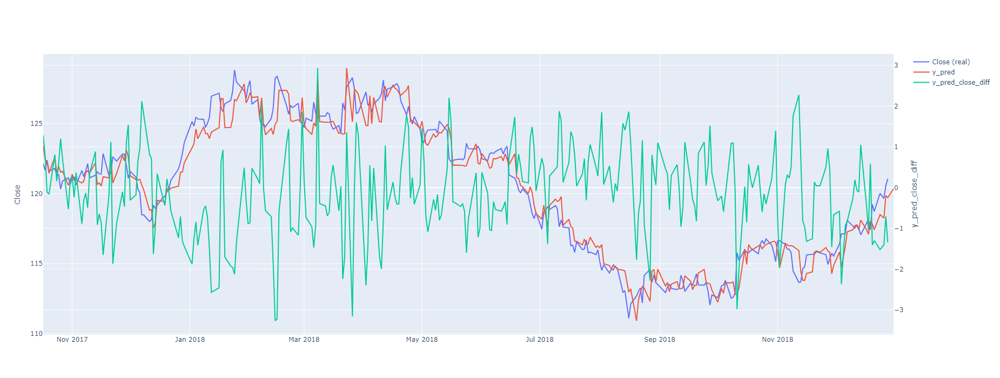

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y


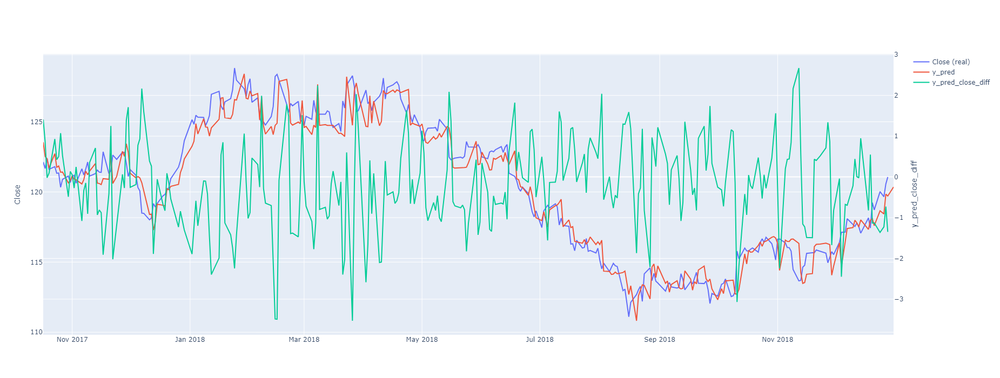

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_3


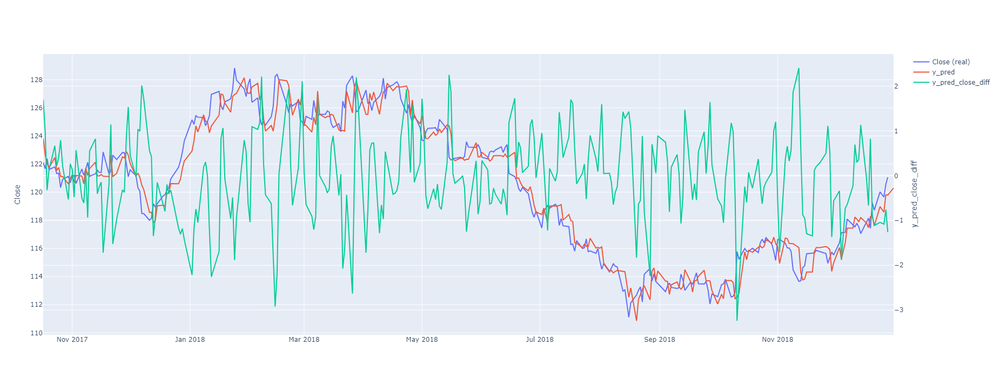

 Plot für Spaltenkombination + StandardScaler(): Close Close_22  DJ_close USB_Price USDI_Price GDX_Close y_5


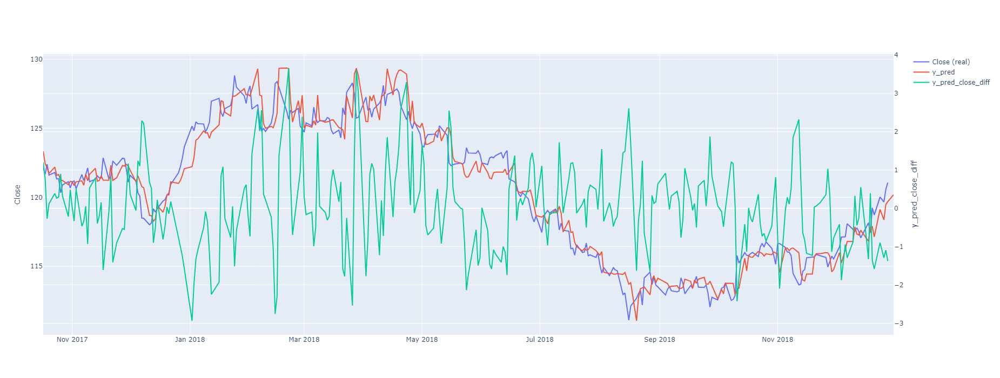

In [244]:
import plotly.graph_objects as go

# anzahl_shift=1
for j, (key, df) in  enumerate( df_plot_dict.items() ):
  print(f" Plot für Spaltenkombination + StandardScaler(): {key}") 
  df_plot= shift_prediction (df, 1) # erzeugen1 neue Zeilen mit Datum als index
  #plot_prediction(df_plot, 300)
  plot_pred_close_diff (df_plot, test_zeile)
